In [65]:
import os
import itertools
import json
import tqdm
import yaml
import math
from enum import Enum
from pprint import pprint

import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.cm import hsv
from torchvision.utils import make_grid
import torchvision.transforms.functional as F

from omegaconf import OmegaConf
from pathlib import Path
from tqdm.auto import tqdm
from dal_toolbox.utils import seed_everything
from dal_toolbox.datasets.utils import FeatureDatasetWrapper
from dal_toolbox.datasets.cifar import CIFAR10Plain

os.makedirs('./learning_curves', exist_ok=True)

base_results_path = os.path.join(os.sep, "mnt", "stud", "work", "ynagel", "results", "al_baselines")
hparams_result_path = os.path.join(os.sep, "mnt", "stud", "work", "ynagel", "results", "xpal_hparams")
finetuning_hparams_result_path = os.path.join(os.sep, "mnt", "stud", "work", "ynagel", "results", "finetuning_hyperparameters")

In [2]:
def load_json(json_file):
    with open(json_file, 'r') as f:
        data = json.load(f)
    return data

def load_results(path):
    path = Path(path)
    assert path.is_dir(), 'Path does not exist.'
    exp_json = path / 'results.json'
    results = load_json(exp_json)
    return results

def load_args(path):
    path = Path(path)
    assert path.is_dir(), 'Path does not exist.'
    exp_cfg = path / '.hydra' / 'config.yaml'
    cfg =  OmegaConf.load(exp_cfg)
    return cfg

def load_checkpoint(path, final=True):
    path = Path(path)
    assert path.is_dir(), 'Path does not exist.'
    if final:
        exp_pth = path / 'model_final.pth'
    else:
        exp_pth = path / 'checkpoint.pth'
    checkpoint = torch.load(exp_pth)
    return checkpoint

def get_experiments(result_path, glob_pattern, train_results=False):
    # Aggregate results over multiple glob pattern such as seeds
    experiments = []
    for exp_path in result_path.glob(glob_pattern):
        try:
            d = load_results(exp_path)
            experiments.append(d)
        except FileNotFoundError:
            print(f"{exp_path} does not exist!") 
    assert len(experiments) != 0, f'No experiments found for {result_path}.'
    return experiments

def create_results_path(dataset, model, strategy, budget): # Deprecated
    return Path(os.path.join(base_results_path, dataset, model, strategy, f"budget_{budget}"))

def xpal_haparams_new_stand_path(kernel, gamma="", alpha=""): # Deprecated
    return Path(os.path.join(hparams_result_path, "CIFAR10", f"pwc_{alpha}_standardized", "xpal", "budget_100", kernel, gamma))

def xpal_haparams_new_path(kernel, gamma="", alpha=""): # Deprecated
    return Path(os.path.join(hparams_result_path, "CIFAR10", f"pwc_{alpha}", "xpal", "budget_100", kernel, gamma))

def xpal_haparams_path(kernel, gamma=""): # Deprecated
    return Path(os.path.join(hparams_result_path, "CIFAR10", "pwc", "random", "budget_100", kernel, gamma))

def xpal_haparams_standardized_path(kernel, gamma=""): # Deprecated
    return Path(os.path.join(hparams_result_path, "CIFAR10_standardized", "pwc", "random", "budget_100", kernel, gamma))

def xpal_hparams_path(dataset, model="pwc", al_strategy="xpal", init_strategy="random", alpha="1e-3", n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate"):
    return Path(os.path.join(hparams_result_path, f"{dataset}", f"{model}", f"{al_strategy}_{init_strategy}", f"{alpha}", f"N_INIT{n_init}__ACQ_SIZE{acq_size}__N_ACQ{n_acq}", f"{kernel}", f"{gamma}"))

def create_new_results_path(dataset,  model, al_strategy, init_strategy, n_init, acq_size, n_acq, suffix=""):
    return Path(os.path.join(base_results_path, f"{dataset}", f"{model}", f"{al_strategy}_{init_strategy}{f'_{suffix}' if suffix != '' else ''}", f"N_INIT{n_init}__ACQ_SIZE{acq_size}__N_ACQ{n_acq}"))

def finetuning_hparams_path(dataset, model="wideresnet2810", al_strategy="random", init_strategy="random", n_init=10, acq_size=10, n_acq=49, model_optimizer_lr="0.1", finetuning_lr="0.01"):
    return Path(os.path.join(finetuning_hparams_result_path, f"{dataset}", f"{model}_finetuned", f"{al_strategy}_{init_strategy}", f"N_INIT{n_init}__ACQ_SIZE{acq_size}__N_ACQ{n_acq}", f"{model_optimizer_lr}_{finetuning_lr}"))

In [16]:
def generate_learning_curves(experiments, stats="test_stats", deprecated=False, print_progress=False):
    learning_curves = {}
    for exp_name, path in tqdm(experiments.items()):
        if print_progress:
            print(f"Laoding results for {exp_name} in {path} - ", end = "")
        seed_results = get_experiments(Path(path), glob_pattern='seed*')
        if print_progress:
            print("Calculating - ", end="")
        seed_accuracies = []
        seed_num_labeled = []
        if deprecated:
            for results in seed_results:
                seed_accuracies.append([val['test_stats']['accuracy'] for key, val in results.items()])
                seed_num_labeled.append([val['n_labeled_samples'] for key, val in results.items()])
        else:
            for results in seed_results:
                for key, val in results.items():
                    seed_accuracies.append([val[stats]['accuracy'] for key, val in results.items() if "cycle" in key])
                    seed_num_labeled.append([val['n_labeled_samples'] for key, val in results.items() if "cycle" in key])
            
        metrics = {
            'acc': np.mean(seed_accuracies, axis=0), 
            'acc_std': np.std(seed_accuracies, axis=0),
            # 'acc_std_err': np.std(seed_accuracies, axis=0) / np.sqrt(np.size(data)),
            'num_labeled': np.mean(seed_num_labeled, axis=0),
            'auc': np.mean(np.mean(seed_accuracies, axis=0))
        }
        learning_curves[exp_name] = metrics
        if print_progress:
            print("Done")
    return learning_curves

def plot_learning_curves(learning_curves, xlim=[None], plot_std=True, title="", save=False, savePath=None, loc="best", legend=True):
    nrows=1
    ncols=len(xlim)
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6.5*ncols, 4*nrows), sharex='col', sharey='col', squeeze=False)
    for idx, ax in enumerate(np.array(axes).flatten()):
        for exp_name, metrics in learning_curves.items():
            if xlim[idx] is not None:
                start = np.where(metrics['num_labeled']==xlim[idx][0])[0][0]
                end = np.where(metrics['num_labeled']==xlim[idx][1])[0][0] + 1
                ls = "-o"
            else:
                start = 0
                end = len(metrics['num_labeled'])
                ls = "-"
                
            ax.plot(metrics['num_labeled'][start:end], metrics['acc'][start:end], ls, label=exp_name)
            if plot_std:
                ax.fill_between(metrics['num_labeled'][start:end], metrics['acc'][start:end] - metrics['acc_std'][start:end], metrics['acc'][start:end] + metrics['acc_std'][start:end], alpha=.5)
        if idx == 0 and legend:
            ax.legend(loc=loc, ncols=len(learning_curves) // 5 + 1)
    
    fig.suptitle(title)
    fig.supxlabel('Number of Annotations')
    fig.supylabel('Accuracy')
    fig.tight_layout()

    if save:
        assert savePath is not None, "savePath has to be specified when saving image"
        plt.savefig(savePath)

    plt.show()

In [4]:
class Dataset(Enum):
    CIFAR10 = "CIFAR10"
    CIFAR100 = "CIFAR100"
    SVHN = "SVHN"
    SVHN_spectral_supervised = "SVHN_spectral_supervised"
    SVHN_supervised = "SVHN_supervised"
    ImageNet100 = "ImageNet"

class Model(Enum):
    PWC = "pwc"
    PWC_Standardized = "pwc_standardized"
    Linear = "linear"
    WR2810_FT = "wideresnet2810_finetuned"
    WR2810 = "wideresnet2810"

class Strategy(Enum):
    Random = "random"
    RandomClust = "randomclust"
    Entropy = "entropy"
    TypiClust = "typiclust"
    CoreSet = "coreset"
    XPAL = "xpal"
    XPALClust = "xpalclust"
    XPAL_NONE = "xpal_None"
    BADGE = "badge"
    LinearXPAL_100 = "linearxpal_100"

budgets = [100, "100_acq_1"]
lp = list(itertools.product(Dataset, Model))

In [70]:
# https://stackoverflow.com/questions/42697933/colormap-with-maximum-distinguishable-colours
def generate_colormap(number_of_distinct_colors: int = 80):
    if number_of_distinct_colors == 0:
        number_of_distinct_colors = 80

    number_of_shades = 7
    number_of_distinct_colors_with_multiply_of_shades = int(math.ceil(number_of_distinct_colors / number_of_shades) * number_of_shades)

    # Create an array with uniformly drawn floats taken from <0, 1) partition
    linearly_distributed_nums = np.arange(number_of_distinct_colors_with_multiply_of_shades) / number_of_distinct_colors_with_multiply_of_shades

    # We are going to reorganise monotonically growing numbers in such way that there will be single array with saw-like pattern
    #     but each saw tooth is slightly higher than the one before
    # First divide linearly_distributed_nums into number_of_shades sub-arrays containing linearly distributed numbers
    arr_by_shade_rows = linearly_distributed_nums.reshape(number_of_shades, number_of_distinct_colors_with_multiply_of_shades // number_of_shades)

    # Transpose the above matrix (columns become rows) - as a result each row contains saw tooth with values slightly higher than row above
    arr_by_shade_columns = arr_by_shade_rows.T

    # Keep number of saw teeth for later
    number_of_partitions = arr_by_shade_columns.shape[0]

    # Flatten the above matrix - join each row into single array
    nums_distributed_like_rising_saw = arr_by_shade_columns.reshape(-1)

    # HSV colour map is cyclic (https://matplotlib.org/tutorials/colors/colormaps.html#cyclic), we'll use this property
    initial_cm = hsv(nums_distributed_like_rising_saw)

    lower_partitions_half = number_of_partitions // 2
    upper_partitions_half = number_of_partitions - lower_partitions_half

    # Modify lower half in such way that colours towards beginning of partition are darker
    # First colours are affected more, colours closer to the middle are affected less
    lower_half = lower_partitions_half * number_of_shades
    for i in range(3):
        initial_cm[0:lower_half, i] *= np.arange(0.2, 1, 0.8/lower_half)

    # Modify second half in such way that colours towards end of partition are less intense and brighter
    # Colours closer to the middle are affected less, colours closer to the end are affected more
    for i in range(3):
        for j in range(upper_partitions_half):
            modifier = np.ones(number_of_shades) - initial_cm[lower_half + j * number_of_shades: lower_half + (j + 1) * number_of_shades, i]
            modifier = j * modifier / upper_partitions_half
            initial_cm[lower_half + j * number_of_shades: lower_half + (j + 1) * number_of_shades, i] += modifier

    return ListedColormap(initial_cm)

xpal_alphas=("1e-1", "1e-2", "1e-3", "1e-4", "1e-5", "1e-6", "1e-7", "1e-8", "1e-9", "1e-10", "1e-11", "1e-12", "1e-13", "1e-14", "1e-15", "1e-16", "1e-17", "1e-18", "1e-19", "1e-20", "0.0", "mean", "quantile_0.1", "quantile_0.25", "quantile_0.33", "median", "quantile_0.66", "quantile_0.75", "quantile_0.9")
xpal_alphas_cmap = generate_colormap(len(xpal_alphas))
xpal_colors={key : color for key, color in zip(xpal_alphas, xpal_alphas_cmap.colors)}
xpal_predefined_alphas= ["0.0", "1e-1", "1e-2", "1e-3", "1e-4", "1e-5", "1e-6", "1e-7", "1e-8", "1e-9", "1e-10", "1e-11", "1e-12", "1e-13", "1e-14", "1e-15", "1e-16", "1e-17", "1e-18", "1e-19", "1e-20"]
xpal_custom_alphas = ["mean", "quantile_0.1", "quantile_0.25", "quantile_0.33", "median", "quantile_0.66", "quantile_0.75", "quantile_0.9"] 

In [83]:
def uniqify(seq, idfun=None): 
   # order preserving
   if idfun is None:
       def idfun(x): return x
   seen = {}
   result = []
   for item in seq:
       marker = idfun(item)
       # in old Python versions:
       # if seen.has_key(marker)
       # but in new ones:
       if marker in seen: continue
       seen[marker] = 1
       result.append(item)
   return result

def plot_learning_curves_supplots(learning_curves_list, nrows, ncols, plot_std=True, title="", save=False, savePath=None, loc="best", xlim=None, sharex=False, sharey=False, axtitle=None):
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6.5*ncols, 4*nrows), sharex=sharex, sharey=sharey)

    for idx, (ax, learning_curves) in enumerate(zip(np.array(axes).flatten(), learning_curves_list)):
        if idx % 3 == 0:
            c_ = "-"
        else:
            c_ = '-o'
        if idx % 3 == 2:
            axin = ax.inset_axes([0.55, 0.05, 0.43, 0.43]) # Plot the data on the inset axis and zoom in on the important part
        for exp_name, metrics in learning_curves.items():
            if xlim is not None and xlim[idx] is not None:
                start = np.where(metrics['num_labeled']==xlim[idx][0])[0][0]
                end = np.where(metrics['num_labeled']==xlim[idx][1])[0][0] + 1
            else:
                start = 0
                end = len(metrics['num_labeled'])
            ax.plot(metrics['num_labeled'][start:end], metrics['acc'][start:end], c_, label=exp_name, c=xpal_colors[exp_name.split('$')[-1]])
            if plot_std:
                ax.fill_between(metrics['num_labeled'][start:end], metrics['acc'][start:end] - metrics['acc_std'][start:end], metrics['acc'][start:end] + metrics['acc_std'][start:end], alpha=.5)
            if idx % 3 == 2:
                axin.plot(metrics['num_labeled'][start:end], metrics['acc'][start:end], c_, label=exp_name, c=xpal_colors[exp_name.split('$')[-1]])

        if idx % 3 == 2:
            axin.set_xlim(metrics['num_labeled'][end - 3] - 2, metrics['num_labeled'][end - 1] + 1)
            axin.set_ylim(metrics['acc'][end - 3] - 0.02, metrics['acc'][end - 1] + 0.02)
            axin.set_xticklabels([])
            ax.indicate_inset_zoom(axin)
        
        if idx == 0:
            ax.legend(loc=loc, ncols=len(learning_curves) // 5 + 1)
        if axtitle is not None:
            ax.set_title(axtitle[idx])

    fig.suptitle (title)
    fig.supxlabel('Number of Annotations')
    fig.supylabel('Accuracy')
    fig.tight_layout()

    if save:
        assert savePath is not None, "savePath has to be specified when saving image"
        plt.savefig(savePath)

    plt.show()

def get_mean_alpha_from_custom_experiments(exps):
    alphas = {}
    for exp_name, path in exps.items():
        seed_results = get_experiments(Path(path), glob_pattern='seed*')

        seed_alphas = []

        for results in seed_results:
            if "alpha" in results.keys():
                seed_alphas.append(results["alpha"])
            else:
                seed_alphas.append(float(exp_name.split('$')[-1]))
            
        metrics = {
            'alpha': np.mean(seed_alphas, axis=0), 
            'alpha_std': np.std(seed_alphas, axis=0), 
        }
        alphas[exp_name] = metrics
    return alphas

def evaluate_experiments(dataset, model, al_strategy, init_strategy, n_init, acq_size, n_acq, kernel="rbf", gamma="calculate", plot_overview=False, force_alpha=None):
    experiments = {"$\\alpha=$" + alpha:xpal_hparams_path(dataset=dataset, model=model, al_strategy=al_strategy, init_strategy=init_strategy, alpha=alpha, n_init=n_init, acq_size=acq_size, n_acq=n_acq, kernel=kernel, gamma=gamma) for alpha in xpal_alphas}

    if acq_size == 1:
        until = 25
    elif acq_size == 10:
        until = 10
    elif acq_size == 100:
        until = 10
    
    validation_curves = generate_learning_curves(experiments, "validation_stats")
    if plot_overview:
        train_curves = generate_learning_curves(experiments, "train_stats")
        test_curves = generate_learning_curves(experiments, "test_stats")

        plot_learning_curves_supplots([train_curves, validation_curves, test_curves], nrows=1, ncols=3, sharey=True)

    best_hparams_learning_curves = sorted(validation_curves.items(), key=lambda x: x[1]["acc"][-1], reverse=True)[:3]
    xpal_best_alphas = [key.split('$')[-1] for key, _ in best_hparams_learning_curves]

    best_hparams_learning_curves = sorted(validation_curves.items(), key=lambda x: np.max(x[1]["acc"]), reverse=True)[:3]
    xpal_best_alphas.extend([key.split('$')[-1] for key, _ in best_hparams_learning_curves])
    
    best_hparams_learning_curves = sorted(validation_curves.items(), key=lambda x: np.mean(x[1]["acc"]), reverse=True)[:3]
    xpal_best_alphas.extend([key.split('$')[-1] for key, _ in best_hparams_learning_curves])

    best_hparams_learning_curves = sorted(validation_curves.items(), key=lambda x: np.mean(x[1]["acc"][:until]), reverse=True)[:3]
    xpal_best_alphas.extend([key.split('$')[-1] for key, _ in best_hparams_learning_curves])

    xpal_best_alphas = uniqify(xpal_best_alphas)
    best_experiments = {f"$\\alpha=${alpha}":xpal_hparams_path(dataset=dataset, model=model, al_strategy=al_strategy, init_strategy=init_strategy, alpha=alpha, n_init=n_init, acq_size=acq_size, n_acq=n_acq, kernel=kernel, gamma=gamma) for alpha in xpal_best_alphas}

    if force_alpha:
        if f"$\\alpha=${force_alpha}" not in best_experiments.keys():
            best_experiments[f"$\\alpha=${force_alpha}"] = xpal_hparams_path(dataset=dataset, model=model, al_strategy=al_strategy, init_strategy=init_strategy, alpha=force_alpha, n_init=n_init, acq_size=acq_size, n_acq=n_acq, kernel=kernel, gamma=gamma)
    
    best_val_curves = generate_learning_curves(best_experiments, "validation_stats")
    best_test_curves = generate_learning_curves(best_experiments, "test_stats")

    if acq_size == 10:
        xlims = [None, (400, 500), (10, 100), None, (400, 500), (10, 100)]
    elif acq_size == 1:
        xlims = [None, (275, 300), (1, 25), None, (275, 300), (1, 25)]
    elif acq_size == 100:
        xlims = [None, (1000, 1500), (100, 1000), None, (1000, 1500), (100, 1000)]
    titles = ["Validation - Full Curve", "Validation - End", "Validation - Start", "Test - Full Curve", "Test - End", "Test - Start"]
    curves = [best_val_curves, best_val_curves, best_val_curves, best_test_curves, best_test_curves, best_test_curves]
    plot_learning_curves_supplots(curves, nrows=2, ncols=3, sharey='col', sharex='col', xlim=xlims, plot_std=False, title=f"{dataset} - {model} - {al_strategy}, {init_strategy} init", axtitle=titles)

    for i in range(0,  n_init + acq_size * n_acq):
        if n_init + acq_size * i >= 100:
            samples_100_breakpoint = i
            break
    _max_acc_key = None
    _max_acc_100_key = None
    _max_auc_key = None
    _max_early_auc_key = None
    max_acc = 0
    max_acc_100 = 0
    max_auc = 0
    max_early_auc = 0

    for key, value in validation_curves.items():
        if value["acc"][-1] > max_acc:
            _max_acc_key = key
            max_acc = value["acc"][-1]
        if value["acc"][samples_100_breakpoint] > max_acc_100:
            _max_acc_100_key = key
            max_acc_100 = value["acc"][samples_100_breakpoint]
        if value["auc"] > max_auc:
            _max_auc_key = key
            value["auc"]
        if np.mean(value["acc"][:until]) > max_early_auc:
            _max_early_auc_key = key
            max_early_auc = np.mean(value["acc"][:until])

    print("-- Performance INFO --")
    print(f"Max final validation accuracy: {max_acc:.3f} reached with alpha={_max_acc_key.split('$')[-1]}")
    print(f"Max final validation accuracy after {n_init + acq_size * samples_100_breakpoint} samples: {max_acc_100:.3f} reached with alpha={_max_acc_100_key.split('$')[-1]}")
    print(f"Max validation AUC: {max_auc:.3f} reached with alpha={_max_auc_key.split('$')[-1]}")
    print(f"Max early validation AUC: {max_early_auc:.3f} reached with alpha={_max_early_auc_key.split('$')[-1]}")
    print("\n-- ALPHA - INFO --")
    mean_alphas = get_mean_alpha_from_custom_experiments(best_experiments)
    for key, value in mean_alphas.items():
        if key in [_max_acc_key, _max_acc_100_key, _max_auc_key]:
            print(f"{key} -> {value['alpha']:.3e} (± {value['alpha_std']:.2e})")

def get_hyperparameter_papaer_statistics(dataset, model, al_strategy, init_strategy, n_init, acq_size, n_acq, kernel="rbf", gamma="calculate", baseline="1e-3"):
    experiments = {"$\\alpha=$" + alpha:xpal_hparams_path(dataset=dataset, model=model, al_strategy=al_strategy, init_strategy=init_strategy, alpha=alpha, n_init=n_init, acq_size=acq_size, n_acq=n_acq, kernel=kernel, gamma=gamma) for alpha in xpal_alphas}
    
    validation_curves = generate_learning_curves(experiments, "validation_stats")
    
    _max_predefined_macc_key = None
    _max_custom_macc_key = None
    _max_predefined_auc_key = None
    _max_custom_auc_key = None

    max_predefined_macc = 0
    max_custom_macc = 0
    max_predefined_auc = 0
    max_custom_auc = 0

    for key, value in validation_curves.items():
        if key.split('$')[-1] in xpal_predefined_alphas:
            if value["acc"].max() > max_predefined_macc:
                _max_predefined_macc_key = key
                max_predefined_macc = value["acc"].max()
            if value["auc"] > max_predefined_auc:
                _max_predefined_auc_key = key
                max_predefined_auc = value["auc"]
        elif key.split('$')[-1] in xpal_custom_alphas:
            if value["acc"].max() > max_custom_macc:
                _max_custom_macc_key = key
                max_custom_macc = value["acc"].max()
            if value["auc"] > max_custom_auc:
                _max_custom_auc_key = key
                max_custom_auc = value["auc"]
        else:
            pass
            # raise ValueError("key does not exit in lists.")
            
    baseline_macc = validation_curves[f"$\\alpha=${baseline}"]["acc"].max()
    baseline_auc = validation_curves[f"$\\alpha=${baseline}"]["auc"]
    
    print("-- Performance INFO --")
    print(f"Max predefined max validation accuracy: {max_predefined_macc:.4f} reached with alpha={_max_predefined_macc_key.split('$')[-1]}")
    print(f"Max custom max validation accuracy: {max_custom_macc:.4f} reached with alpha={_max_custom_macc_key.split('$')[-1]}")
    print(f"Max baseline max validation accuracy: {baseline_macc:.4f} reached with alpha={baseline}")
    print(f"Max predefined validation AUC: {max_predefined_auc:.4f} reached with alpha={_max_predefined_auc_key.split('$')[-1]}")
    print(f"Max predefined validation AUC: {max_custom_auc:.4f} reached with alpha={_max_custom_auc_key.split('$')[-1]}")
    print(f"Max baseline validation AUC: {baseline_auc:.4f} reached with alpha={baseline}")

    test_curves = generate_learning_curves(experiments, "test_stats")

    max_predefined_macc = test_curves[_max_predefined_macc_key]["acc"].max()
    max_custom_macc = test_curves[_max_custom_macc_key]["acc"].max()
    max_predefined_auc = test_curves[_max_predefined_auc_key]["auc"]
    max_custom_auc = test_curves[_max_custom_auc_key]["auc"]
    baseline_macc = test_curves[f"$\\alpha=${baseline}"]["acc"].max()
    baseline_auc = test_curves[f"$\\alpha=${baseline}"]["auc"]
    
    print(f"Max predefined max test accuracy: {max_predefined_macc:.4f}")
    print(f"Max custom max test accuracy: {max_custom_macc:.4f}")
    print(f"Max baseline max test accuracy: {baseline_macc:.4f}")
    print(f"Max predefined test AUC: {max_predefined_auc:.4f}")
    print(f"Max predefined test AUC: {max_custom_auc:.4f}")
    print(f"Max baseline test AUC: {baseline_auc:.4f}")

    customs_exps = [_max_custom_macc_key.split('$')[-1], _max_custom_auc_key.split('$')[-1]]
    customs_exps = {f"$\\alpha=${alpha}":xpal_hparams_path(dataset=dataset, model=model, al_strategy=al_strategy, init_strategy=init_strategy, alpha=alpha, n_init=n_init, acq_size=acq_size, n_acq=n_acq, kernel=kernel, gamma=gamma) for alpha in customs_exps} 
    mean_alphas = get_mean_alpha_from_custom_experiments(customs_exps)
    
    print("\n-- ALPHA - INFO --")
    for key, value in mean_alphas.items():
        if key in [_max_custom_macc_key, _max_custom_auc_key]:
            print(f"alpha={key.split('$')[-1]}-> {value['alpha']:.3e} (± {value['alpha_std']:.2e})")

### CIFAR10 Hyperparameters

100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


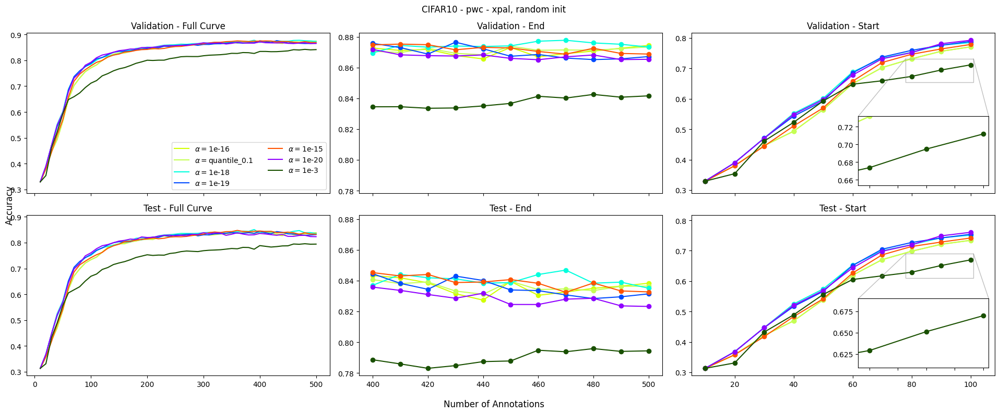

-- Performance INFO --
Max final validation accuracy: 0.874 reached with alpha=1e-16
Max final validation accuracy after 100 samples: 0.793 reached with alpha=1e-20
Max validation AUC: 0.809 reached with alpha=1e-18
Max early validation AUC: 0.608 reached with alpha=1e-18

-- ALPHA - INFO --
$\alpha=$1e-16 -> 1.000e-16 (± 1.23e-32)
$\alpha=$1e-18 -> 1.000e-18 (± 0.00e+00)
$\alpha=$1e-20 -> 1.000e-20 (± 0.00e+00)


In [8]:
evaluate_experiments(dataset=Dataset.CIFAR10.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [85]:
get_hyperparameter_papaer_statistics(dataset=Dataset.CIFAR10.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [00:40<00:00,  1.38s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.8778 reached with alpha=1e-18
Max custom max validation accuracy: 0.8738 reached with alpha=quantile_0.1
Max baseline max validation accuracy: 0.8425 reached with alpha=1e-3
Max predefined validation AUC: 0.8089 reached with alpha=1e-18
Max predefined validation AUC: 0.8003 reached with alpha=quantile_0.1
Max baseline validation AUC: 0.7610 reached with alpha=1e-3


100%|██████████| 29/29 [00:39<00:00,  1.36s/it]


Max predefined max test accuracy: 0.8507
Max custom max test accuracy: 0.8407
Max baseline max test accuracy: 0.7958
Max predefined test AUC: 0.7787
Max predefined test AUC: 0.7688
Max baseline test AUC: 0.7158

-- ALPHA - INFO --
alpha=quantile_0.1-> 1.277e-16 (± 7.17e-18)


100%|██████████| 7/7 [00:08<00:00,  1.29s/it]


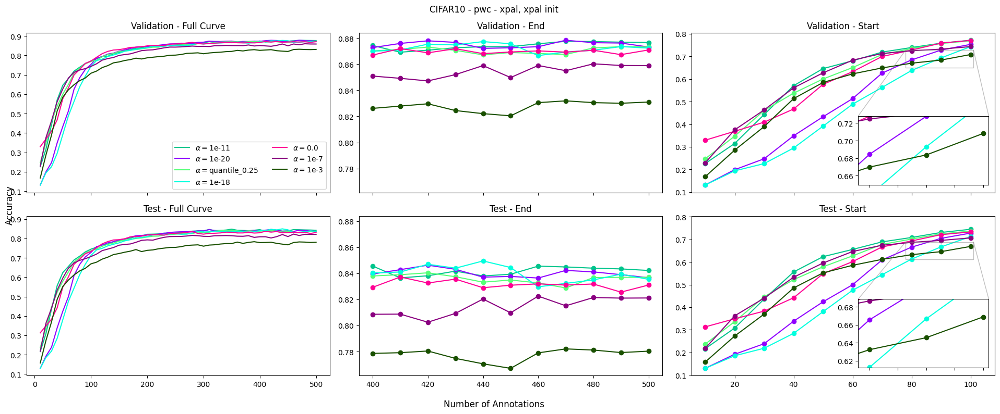

-- Performance INFO --
Max final validation accuracy: 0.877 reached with alpha=1e-11
Max final validation accuracy after 100 samples: 0.776 reached with alpha=quantile_0.33
Max validation AUC: 0.801 reached with alpha=1e-11
Max early validation AUC: 0.587 reached with alpha=1e-11

-- ALPHA - INFO --
$\alpha=$1e-11 -> 1.000e-11 (± 0.00e+00)


In [9]:
evaluate_experiments(dataset=Dataset.CIFAR10.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [86]:
get_hyperparameter_papaer_statistics(dataset=Dataset.CIFAR10.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [02:09<00:00,  4.46s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.8784 reached with alpha=1e-20
Max custom max validation accuracy: 0.8742 reached with alpha=quantile_0.1
Max baseline max validation accuracy: 0.8319 reached with alpha=1e-3
Max predefined validation AUC: 0.8009 reached with alpha=1e-11
Max predefined validation AUC: 0.7976 reached with alpha=quantile_0.25
Max baseline validation AUC: 0.7488 reached with alpha=1e-3


100%|██████████| 29/29 [00:40<00:00,  1.38s/it]


Max predefined max test accuracy: 0.8462
Max custom max test accuracy: 0.8446
Max baseline max test accuracy: 0.7832
Max predefined test AUC: 0.7745
Max predefined test AUC: 0.7677
Max baseline test AUC: 0.7050

-- ALPHA - INFO --
alpha=quantile_0.1-> 1.277e-16 (± 7.17e-18)
alpha=quantile_0.25-> 2.715e-11 (± 2.54e-13)


100%|██████████| 8/8 [00:10<00:00,  1.28s/it]


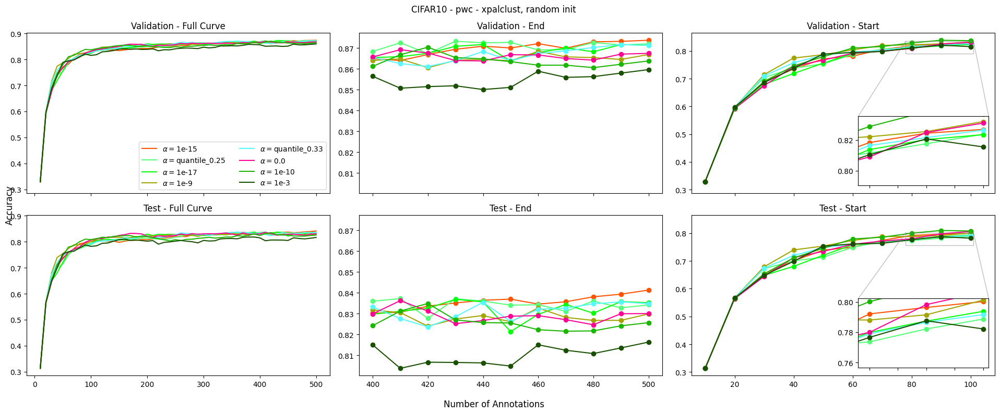

-- Performance INFO --
Max final validation accuracy: 0.874 reached with alpha=1e-15
Max final validation accuracy after 100 samples: 0.840 reached with alpha=1e-13
Max validation AUC: 0.833 reached with alpha=1e-9
Max early validation AUC: 0.730 reached with alpha=1e-9

-- ALPHA - INFO --
$\alpha=$1e-15 -> 1.000e-15 (± 0.00e+00)
$\alpha=$1e-9 -> 1.000e-09 (± 0.00e+00)


In [10]:
evaluate_experiments(dataset=Dataset.CIFAR10.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [87]:
get_hyperparameter_papaer_statistics(dataset=Dataset.CIFAR10.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [02:10<00:00,  4.51s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.8737 reached with alpha=1e-15
Max custom max validation accuracy: 0.8732 reached with alpha=quantile_0.25
Max baseline max validation accuracy: 0.8596 reached with alpha=1e-3
Max predefined validation AUC: 0.8334 reached with alpha=1e-9
Max predefined validation AUC: 0.8327 reached with alpha=quantile_0.33
Max baseline validation AUC: 0.8201 reached with alpha=1e-3


100%|██████████| 29/29 [00:40<00:00,  1.39s/it]


Max predefined max test accuracy: 0.8413
Max custom max test accuracy: 0.8372
Max baseline max test accuracy: 0.8182
Max predefined test AUC: 0.7997
Max predefined test AUC: 0.7980
Max baseline test AUC: 0.7817

-- ALPHA - INFO --
alpha=quantile_0.25-> 2.715e-11 (± 2.54e-13)
alpha=quantile_0.33-> 1.128e-09 (± 3.20e-12)


100%|██████████| 8/8 [00:10<00:00,  1.25s/it]


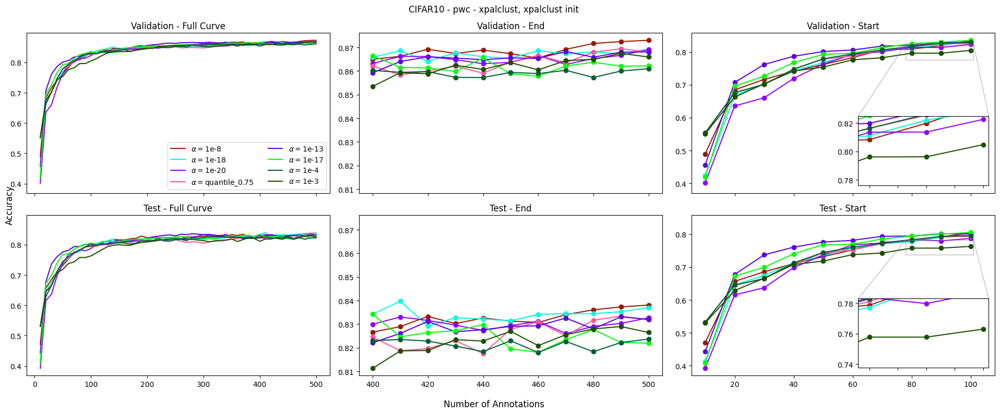

-- Performance INFO --
Max final validation accuracy: 0.873 reached with alpha=1e-8
Max final validation accuracy after 100 samples: 0.835 reached with alpha=1e-17
Max validation AUC: 0.839 reached with alpha=1e-13
Max early validation AUC: 0.761 reached with alpha=1e-13

-- ALPHA - INFO --
$\alpha=$1e-8 -> 1.000e-08 (± 0.00e+00)
$\alpha=$1e-13 -> 1.000e-13 (± 0.00e+00)
$\alpha=$1e-17 -> 1.000e-17 (± 0.00e+00)


In [11]:
evaluate_experiments(dataset=Dataset.CIFAR10.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [88]:
get_hyperparameter_papaer_statistics(dataset=Dataset.CIFAR10.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [02:01<00:00,  4.20s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.8730 reached with alpha=1e-8
Max custom max validation accuracy: 0.8694 reached with alpha=quantile_0.75
Max baseline max validation accuracy: 0.8675 reached with alpha=1e-3
Max predefined validation AUC: 0.8394 reached with alpha=1e-13
Max predefined validation AUC: 0.8336 reached with alpha=quantile_0.66
Max baseline validation AUC: 0.8286 reached with alpha=1e-3


100%|██████████| 29/29 [00:39<00:00,  1.36s/it]


Max predefined max test accuracy: 0.8381
Max custom max test accuracy: 0.8334
Max baseline max test accuracy: 0.8290
Max predefined test AUC: 0.8072
Max predefined test AUC: 0.7993
Max baseline test AUC: 0.7907

-- ALPHA - INFO --
alpha=quantile_0.75-> 9.485e-05 (± 1.10e-06)
alpha=quantile_0.66-> 1.461e-05 (± 1.90e-07)


100%|██████████| 7/7 [00:09<00:00,  1.32s/it]


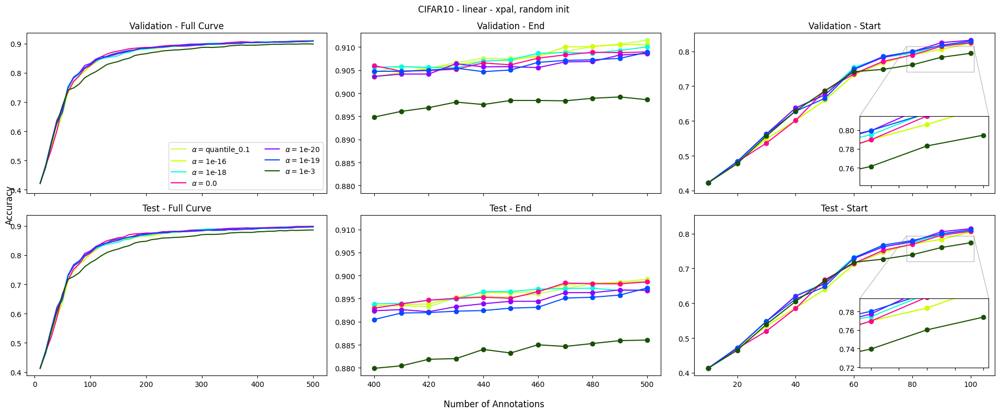

-- Performance INFO --
Max final validation accuracy: 0.911 reached with alpha=quantile_0.1
Max final validation accuracy after 100 samples: 0.832 reached with alpha=1e-20
Max validation AUC: 0.849 reached with alpha=0.0
Max early validation AUC: 0.677 reached with alpha=1e-20

-- ALPHA - INFO --
$\alpha=$quantile_0.1 -> 1.277e-16 (± 7.17e-18)
$\alpha=$0.0 -> 0.000e+00 (± 0.00e+00)
$\alpha=$1e-20 -> 1.000e-20 (± 0.00e+00)


In [12]:
evaluate_experiments(dataset=Dataset.CIFAR10.value, model=Model.Linear.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [89]:
get_hyperparameter_papaer_statistics(dataset=Dataset.CIFAR10.value, model=Model.Linear.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [02:07<00:00,  4.41s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.9106 reached with alpha=1e-16
Max custom max validation accuracy: 0.9115 reached with alpha=quantile_0.1
Max baseline max validation accuracy: 0.8992 reached with alpha=1e-3
Max predefined validation AUC: 0.8487 reached with alpha=0.0
Max predefined validation AUC: 0.8459 reached with alpha=quantile_0.1
Max baseline validation AUC: 0.8337 reached with alpha=1e-3


100%|██████████| 29/29 [00:40<00:00,  1.39s/it]


Max predefined max test accuracy: 0.8988
Max custom max test accuracy: 0.8992
Max baseline max test accuracy: 0.8860
Max predefined test AUC: 0.8351
Max predefined test AUC: 0.8315
Max baseline test AUC: 0.8167

-- ALPHA - INFO --
alpha=quantile_0.1-> 1.277e-16 (± 7.17e-18)


100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


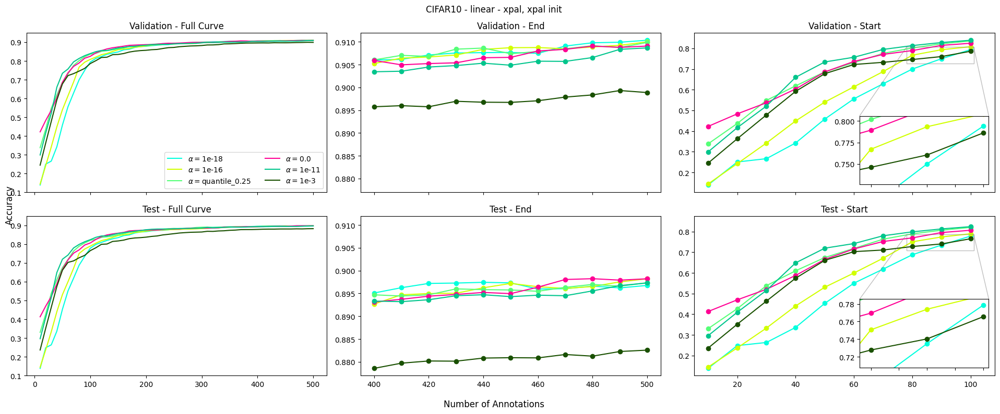

-- Performance INFO --
Max final validation accuracy: 0.910 reached with alpha=1e-18
Max final validation accuracy after 100 samples: 0.839 reached with alpha=1e-11
Max validation AUC: 0.849 reached with alpha=0.0
Max early validation AUC: 0.667 reached with alpha=0.0

-- ALPHA - INFO --
$\alpha=$1e-18 -> 1.000e-18 (± 0.00e+00)
$\alpha=$0.0 -> 0.000e+00 (± 0.00e+00)
$\alpha=$1e-11 -> 1.000e-11 (± 0.00e+00)


In [13]:
evaluate_experiments(dataset=Dataset.CIFAR10.value, model=Model.Linear.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [90]:
get_hyperparameter_papaer_statistics(dataset=Dataset.CIFAR10.value, model=Model.Linear.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [02:10<00:00,  4.52s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.9104 reached with alpha=1e-18
Max custom max validation accuracy: 0.9099 reached with alpha=quantile_0.25
Max baseline max validation accuracy: 0.8993 reached with alpha=1e-3
Max predefined validation AUC: 0.8488 reached with alpha=0.0
Max predefined validation AUC: 0.8464 reached with alpha=quantile_0.25
Max baseline validation AUC: 0.8215 reached with alpha=1e-3


100%|██████████| 29/29 [00:40<00:00,  1.38s/it]


Max predefined max test accuracy: 0.8974
Max custom max test accuracy: 0.8974
Max baseline max test accuracy: 0.8826
Max predefined test AUC: 0.8352
Max predefined test AUC: 0.8344
Max baseline test AUC: 0.8041

-- ALPHA - INFO --
alpha=quantile_0.25-> 2.715e-11 (± 2.54e-13)


100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


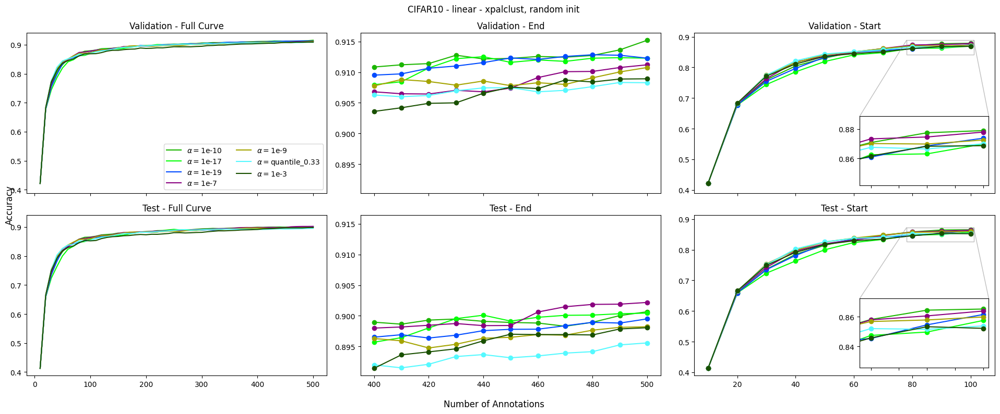

-- Performance INFO --
Max final validation accuracy: 0.915 reached with alpha=1e-10
Max final validation accuracy after 100 samples: 0.879 reached with alpha=1e-10
Max validation AUC: 0.879 reached with alpha=1e-10
Max early validation AUC: 0.786 reached with alpha=1e-9

-- ALPHA - INFO --
$\alpha=$1e-10 -> 1.000e-10 (± 0.00e+00)


In [14]:
evaluate_experiments(dataset=Dataset.CIFAR10.value, model=Model.Linear.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [91]:
get_hyperparameter_papaer_statistics(dataset=Dataset.CIFAR10.value, model=Model.Linear.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [02:12<00:00,  4.58s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.9152 reached with alpha=1e-10
Max custom max validation accuracy: 0.9117 reached with alpha=quantile_0.1
Max baseline max validation accuracy: 0.9089 reached with alpha=1e-3
Max predefined validation AUC: 0.8791 reached with alpha=1e-10
Max predefined validation AUC: 0.8772 reached with alpha=median
Max baseline validation AUC: 0.8723 reached with alpha=1e-3


100%|██████████| 29/29 [00:39<00:00,  1.37s/it]


Max predefined max test accuracy: 0.9007
Max custom max test accuracy: 0.8982
Max baseline max test accuracy: 0.8981
Max predefined test AUC: 0.8657
Max predefined test AUC: 0.8637
Max baseline test AUC: 0.8590

-- ALPHA - INFO --
alpha=quantile_0.1-> 1.277e-16 (± 7.17e-18)
alpha=median-> 3.235e-07 (± 4.28e-09)


100%|██████████| 8/8 [00:10<00:00,  1.29s/it]


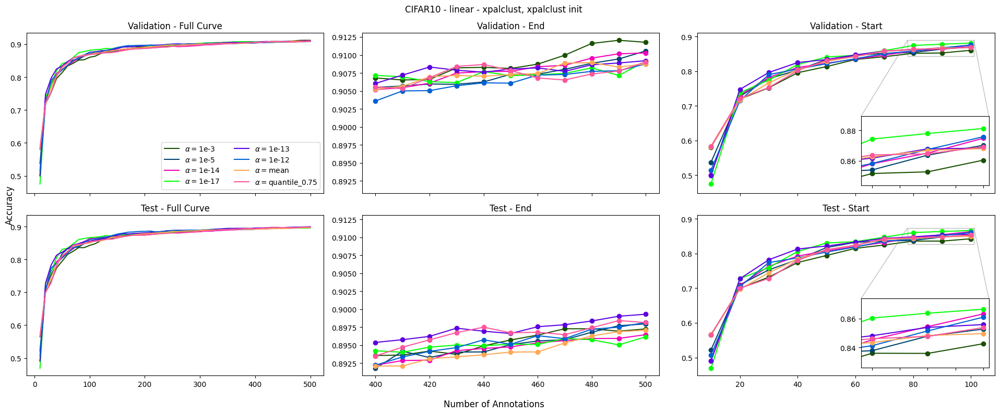

-- Performance INFO --
Max final validation accuracy: 0.912 reached with alpha=1e-3
Max final validation accuracy after 100 samples: 0.881 reached with alpha=1e-17
Max validation AUC: 0.880 reached with alpha=1e-17
Max early validation AUC: 0.800 reached with alpha=1e-13

-- ALPHA - INFO --
$\alpha=$1e-3 -> 1.000e-03 (± 0.00e+00)
$\alpha=$1e-17 -> 1.000e-17 (± 0.00e+00)


In [15]:
evaluate_experiments(dataset=Dataset.CIFAR10.value, model=Model.Linear.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [92]:
get_hyperparameter_papaer_statistics(dataset=Dataset.CIFAR10.value, model=Model.Linear.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [02:16<00:00,  4.70s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.9120 reached with alpha=1e-3
Max custom max validation accuracy: 0.9098 reached with alpha=quantile_0.9
Max baseline max validation accuracy: 0.9120 reached with alpha=1e-3
Max predefined validation AUC: 0.8801 reached with alpha=1e-17
Max predefined validation AUC: 0.8779 reached with alpha=mean
Max baseline validation AUC: 0.8769 reached with alpha=1e-3


100%|██████████| 29/29 [00:39<00:00,  1.38s/it]


Max predefined max test accuracy: 0.8973
Max custom max test accuracy: 0.8980
Max baseline max test accuracy: 0.8973
Max predefined test AUC: 0.8664
Max predefined test AUC: 0.8636
Max baseline test AUC: 0.8626

-- ALPHA - INFO --
alpha=quantile_0.9-> 2.182e-03 (± 1.62e-05)
alpha=mean-> 1.874e-03 (± 5.68e-06)


100%|██████████| 8/8 [01:07<00:00,  8.47s/it]


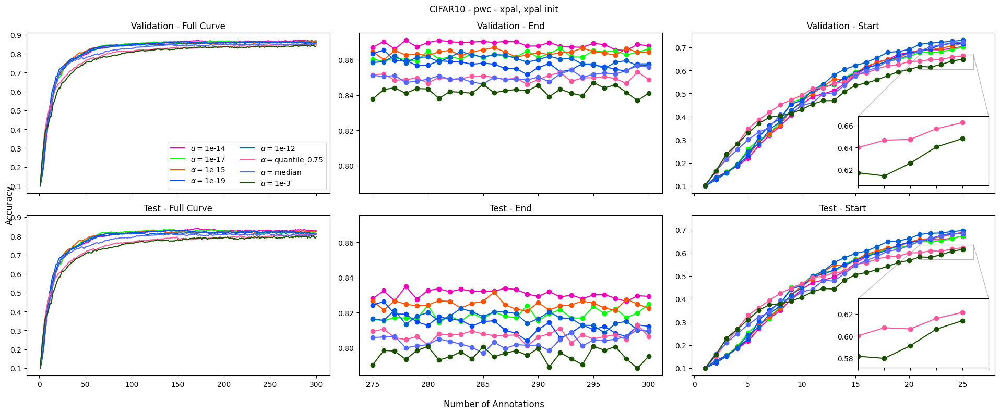

-- Performance INFO --
Max final validation accuracy: 0.868 reached with alpha=1e-14
Max final validation accuracy after 100 samples: 0.854 reached with alpha=1e-17
Max validation AUC: 0.819 reached with alpha=1e-17
Max early validation AUC: 0.501 reached with alpha=1e-12

-- ALPHA - INFO --
$\alpha=$1e-14 -> 1.000e-14 (± 0.00e+00)
$\alpha=$1e-17 -> 1.000e-17 (± 0.00e+00)


In [16]:
evaluate_experiments(dataset=Dataset.CIFAR10.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [93]:
get_hyperparameter_papaer_statistics(dataset=Dataset.CIFAR10.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [09:57<00:00, 20.62s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.8712 reached with alpha=1e-14
Max custom max validation accuracy: 0.8655 reached with alpha=quantile_0.25
Max baseline max validation accuracy: 0.8471 reached with alpha=1e-3
Max predefined validation AUC: 0.8192 reached with alpha=1e-17
Max predefined validation AUC: 0.8107 reached with alpha=quantile_0.1
Max baseline validation AUC: 0.7830 reached with alpha=1e-3


100%|██████████| 29/29 [04:21<00:00,  9.02s/it]


Max predefined max test accuracy: 0.8411
Max custom max test accuracy: 0.8250
Max baseline max test accuracy: 0.8008
Max predefined test AUC: 0.7853
Max predefined test AUC: 0.7755
Max baseline test AUC: 0.7387

-- ALPHA - INFO --
alpha=quantile_0.25-> 2.715e-11 (± 2.54e-13)
alpha=quantile_0.1-> 1.277e-16 (± 7.17e-18)


100%|██████████| 7/7 [00:56<00:00,  8.04s/it]


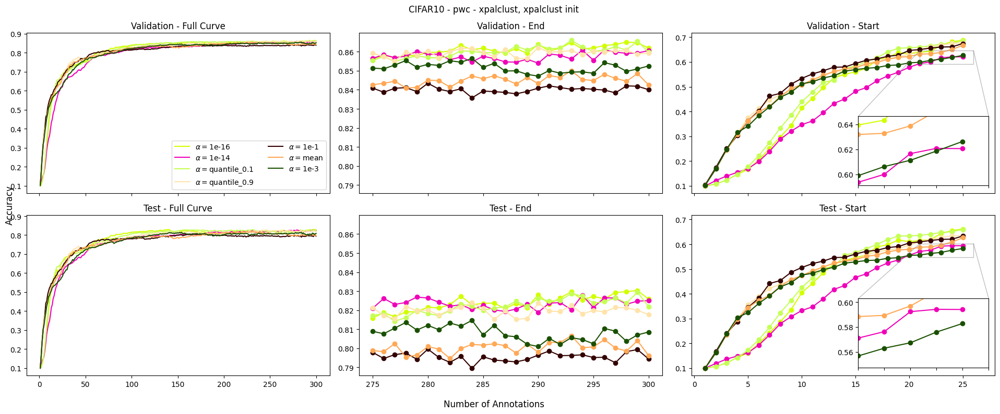

-- Performance INFO --
Max final validation accuracy: 0.862 reached with alpha=1e-16
Max final validation accuracy after 100 samples: 0.841 reached with alpha=1e-16
Max validation AUC: 0.805 reached with alpha=quantile_0.9
Max early validation AUC: 0.514 reached with alpha=1e-1

-- ALPHA - INFO --
$\alpha=$1e-16 -> 1.000e-16 (± 1.23e-32)
$\alpha=$quantile_0.9 -> 2.182e-03 (± 1.62e-05)


In [17]:
evaluate_experiments(dataset=Dataset.CIFAR10.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [94]:
get_hyperparameter_papaer_statistics(dataset=Dataset.CIFAR10.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [07:43<00:00, 15.99s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.8651 reached with alpha=1e-16
Max custom max validation accuracy: 0.8660 reached with alpha=quantile_0.1
Max baseline max validation accuracy: 0.8565 reached with alpha=1e-3
Max predefined validation AUC: 0.8027 reached with alpha=1e-16
Max predefined validation AUC: 0.8053 reached with alpha=quantile_0.9
Max baseline validation AUC: 0.7953 reached with alpha=1e-3


100%|██████████| 29/29 [04:22<00:00,  9.05s/it]


Max predefined max test accuracy: 0.8303
Max custom max test accuracy: 0.8298
Max baseline max test accuracy: 0.8146
Max predefined test AUC: 0.7721
Max predefined test AUC: 0.7691
Max baseline test AUC: 0.7562

-- ALPHA - INFO --
alpha=quantile_0.1-> 1.277e-16 (± 7.17e-18)
alpha=quantile_0.9-> 2.182e-03 (± 1.62e-05)


100%|██████████| 9/9 [01:16<00:00,  8.45s/it]


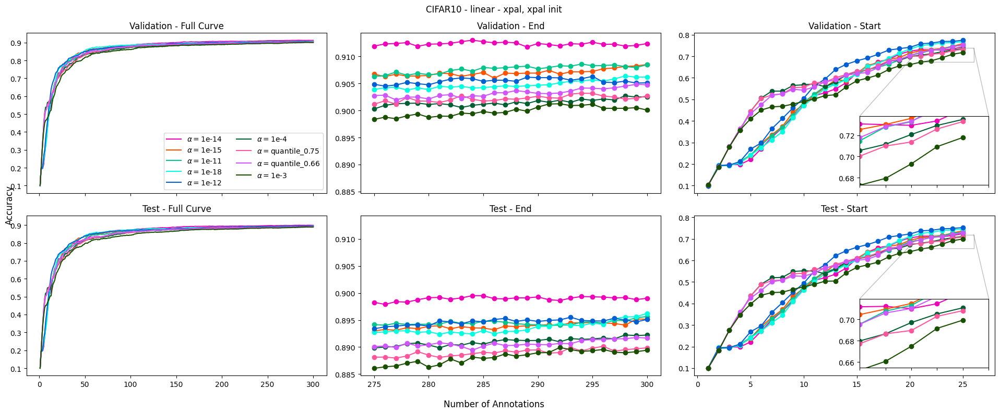

-- Performance INFO --
Max final validation accuracy: 0.912 reached with alpha=1e-14
Max final validation accuracy after 100 samples: 0.888 reached with alpha=0.0
Max validation AUC: 0.858 reached with alpha=1e-14
Max early validation AUC: 0.560 reached with alpha=1e-4

-- ALPHA - INFO --
$\alpha=$1e-14 -> 1.000e-14 (± 0.00e+00)


In [18]:
evaluate_experiments(dataset=Dataset.CIFAR10.value, model=Model.Linear.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [95]:
get_hyperparameter_papaer_statistics(dataset=Dataset.CIFAR10.value, model=Model.Linear.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [07:57<00:00, 16.47s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.9130 reached with alpha=1e-14
Max custom max validation accuracy: 0.9063 reached with alpha=quantile_0.1
Max baseline max validation accuracy: 0.9012 reached with alpha=1e-3
Max predefined validation AUC: 0.8579 reached with alpha=1e-14
Max predefined validation AUC: 0.8542 reached with alpha=quantile_0.66
Max baseline validation AUC: 0.8414 reached with alpha=1e-3


100%|██████████| 29/29 [04:17<00:00,  8.89s/it]


Max predefined max test accuracy: 0.8995
Max custom max test accuracy: 0.8945
Max baseline max test accuracy: 0.8899
Max predefined test AUC: 0.8453
Max predefined test AUC: 0.8387
Max baseline test AUC: 0.8264

-- ALPHA - INFO --
alpha=quantile_0.1-> 1.277e-16 (± 7.17e-18)
alpha=quantile_0.66-> 1.461e-05 (± 1.90e-07)


100%|██████████| 8/8 [01:07<00:00,  8.38s/it]


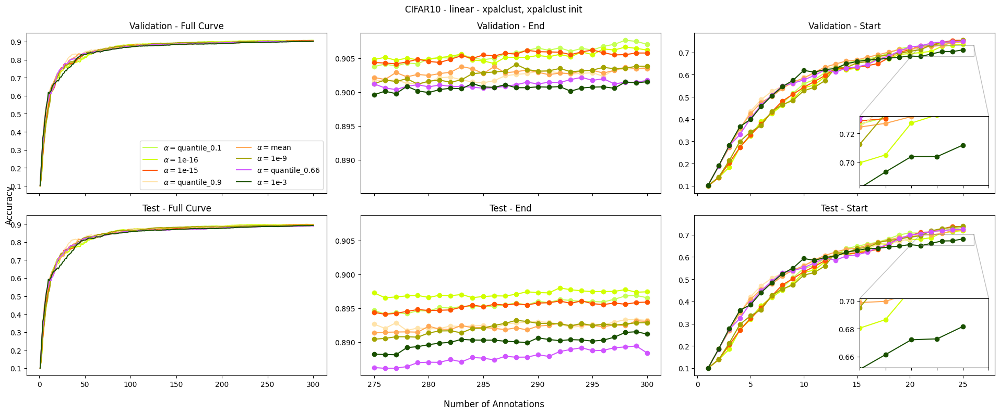

-- Performance INFO --
Max final validation accuracy: 0.907 reached with alpha=quantile_0.1
Max final validation accuracy after 100 samples: 0.885 reached with alpha=1e-16
Max validation AUC: 0.856 reached with alpha=quantile_0.9
Max early validation AUC: 0.576 reached with alpha=mean

-- ALPHA - INFO --
$\alpha=$quantile_0.1 -> 1.277e-16 (± 7.17e-18)
$\alpha=$1e-16 -> 1.000e-16 (± 1.23e-32)
$\alpha=$quantile_0.9 -> 2.182e-03 (± 1.62e-05)


In [19]:
evaluate_experiments(dataset=Dataset.CIFAR10.value, model=Model.Linear.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [96]:
get_hyperparameter_papaer_statistics(dataset=Dataset.CIFAR10.value, model=Model.Linear.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [09:31<00:00, 19.72s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.9066 reached with alpha=1e-16
Max custom max validation accuracy: 0.9076 reached with alpha=quantile_0.1
Max baseline max validation accuracy: 0.9015 reached with alpha=1e-3
Max predefined validation AUC: 0.8523 reached with alpha=1e-9
Max predefined validation AUC: 0.8564 reached with alpha=quantile_0.9
Max baseline validation AUC: 0.8473 reached with alpha=1e-3


100%|██████████| 29/29 [04:18<00:00,  8.93s/it]


Max predefined max test accuracy: 0.8980
Max custom max test accuracy: 0.8969
Max baseline max test accuracy: 0.8915
Max predefined test AUC: 0.8405
Max predefined test AUC: 0.8447
Max baseline test AUC: 0.8327

-- ALPHA - INFO --
alpha=quantile_0.1-> 1.277e-16 (± 7.17e-18)
alpha=quantile_0.9-> 2.182e-03 (± 1.62e-05)


In [20]:
# Not used, use optimal for every test

def rank_alphas(datasets, models, strategies, al_settings, kernel="rbf", gamma="calculate"):
    final_rankings = {alpha : 0 for alpha in xpal_alphas}
    max_rankings = {alpha : 0 for alpha in xpal_alphas}
    auc_rankings = {alpha : 0 for alpha in xpal_alphas}
    early_auc_rankings = {alpha : 0 for alpha in xpal_alphas}

    lp = list(itertools.product(datasets, models, strategies, al_settings))
    num_exps = len(lp)

    for dataset, model, strategy, al_setting in tqdm(lp):
        experiments = {"$\\alpha=$" + alpha:xpal_hparams_path(dataset=dataset, model=model, al_strategy=strategy[0], init_strategy=strategy[1], alpha=alpha, n_init=al_setting[0], acq_size=al_setting[1], n_acq=al_setting[2], kernel=kernel, gamma=gamma) for alpha in xpal_alphas}
        if strategy[1] == "random" and al_setting[1] == 1:
            continue

        validation_curves = generate_learning_curves(experiments, "validation_stats")
    
        best_hparams_learning_curves = sorted(validation_curves.items(), key=lambda x: x[1]["acc"][-1], reverse=True) # Final
        xpal_best_alphas = [key.split('$')[-1] for key, _ in best_hparams_learning_curves]

        for idx, alpha in enumerate(xpal_best_alphas):
            final_rankings[alpha] += (idx + 1)

        best_hparams_learning_curves = sorted(validation_curves.items(), key=lambda x: np.max(x[1]["acc"]), reverse=True) # Max
        xpal_best_alphas = [key.split('$')[-1] for key, _ in best_hparams_learning_curves]

        for idx, alpha in enumerate(xpal_best_alphas):
            max_rankings[alpha] += (idx + 1)
    
        best_hparams_learning_curves = sorted(validation_curves.items(), key=lambda x: np.mean(x[1]["acc"]), reverse=True) # AUC
        xpal_best_alphas = [key.split('$')[-1] for key, _ in best_hparams_learning_curves]

        for idx, alpha in enumerate(xpal_best_alphas):
            auc_rankings[alpha] += (idx + 1)

        until = 25 if strategy[1] == 1 else 10
        best_hparams_learning_curves = sorted(validation_curves.items(), key=lambda x: np.mean(x[1]["acc"][:until]), reverse=True) # Low Budget AUC
        xpal_best_alphas = [key.split('$')[-1] for key, _ in best_hparams_learning_curves]

        for idx, alpha in enumerate(xpal_best_alphas):
            early_auc_rankings[alpha] += (idx + 1)


    final_rankings = {k: v / num_exps for k, v in sorted(final_rankings.items(), key=lambda item: item[1])}
    max_rankings = {k: v /num_exps for k, v in sorted(max_rankings.items(), key=lambda item: item[1])}
    auc_rankings = {k: v /num_exps for k, v in sorted(auc_rankings.items(), key=lambda item: item[1])}
    early_auc_rankings = {k: v /num_exps for k, v in sorted(early_auc_rankings.items(), key=lambda item: item[1])}
    
    return final_rankings, max_rankings, auc_rankings, early_auc_rankings

### CIFAR10 AL Plots

100%|██████████| 10/10 [02:56<00:00, 17.70s/it]


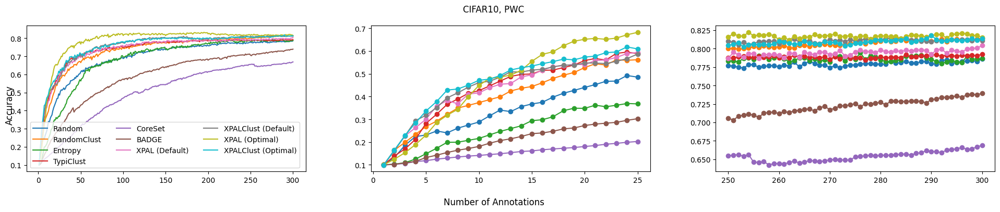

100%|██████████| 10/10 [05:57<00:00, 35.79s/it]


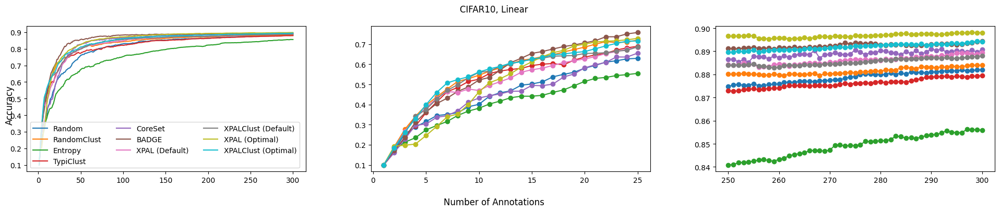

In [10]:
n_init=1
acq_size=1
n_acq=299


for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.RandomClust.value, Strategy.RandomClust.value, n_init, acq_size, n_acq),
        "Entropy": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "TypiClust": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq),
        "CoreSet": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "BADGE": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.BADGE.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "XPAL (Default)": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.XPAL.value, Strategy.XPAL.value, n_init, acq_size, n_acq, suffix="default"),
        "XPALClust (Default)": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="default"),
        "XPAL (Optimal)": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.XPAL.value, Strategy.XPAL.value, n_init, acq_size, n_acq, suffix="optimal"),
        "XPALClust (Optimal)": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="optimal"),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"CIFAR10, {model_name}", save=False, savePath="", plot_std=False, xlim=[None, (1, 25), (250, 300)])
    except FileNotFoundError as e:
        print(e)

100%|██████████| 10/10 [00:47<00:00,  4.79s/it]


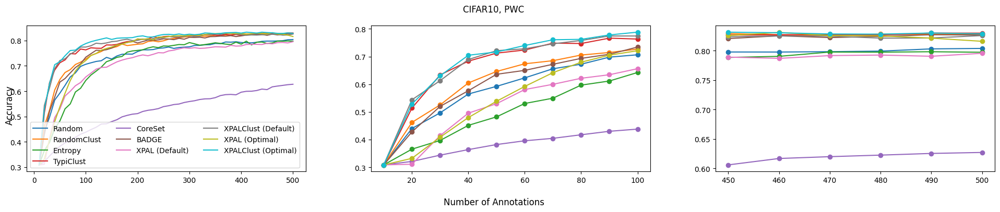

100%|██████████| 10/10 [00:49<00:00,  4.91s/it]


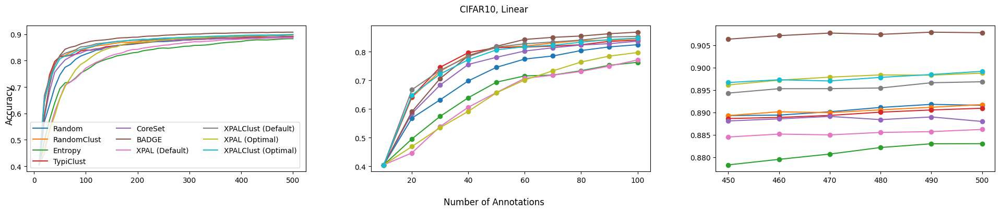

In [22]:
n_init=10
acq_size=10
n_acq=49


for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.RandomClust.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "Entropy": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "TypiClust": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.TypiClust.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "CoreSet": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "BADGE": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.BADGE.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "XPAL (Default)": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="default"),
        "XPALClust (Default)": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.XPALClust.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="default"),
        "XPAL (Optimal)": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
        "XPALClust (Optimal)": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.XPALClust.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"CIFAR10, {model_name}", save=False, savePath="", plot_std=False, xlim=[None, (10, 100), (450, 500)])
    except FileNotFoundError as e:
        print(e)

100%|██████████| 10/10 [01:22<00:00,  8.25s/it]


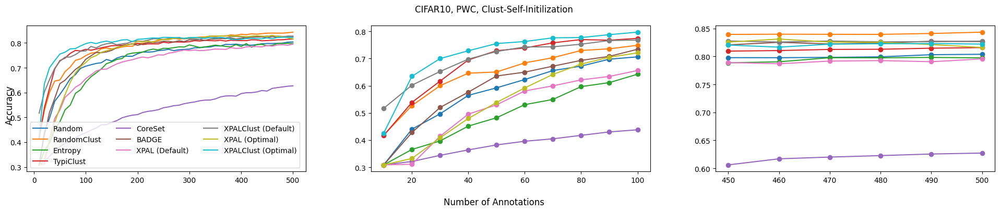

100%|██████████| 11/11 [01:34<00:00,  8.63s/it]


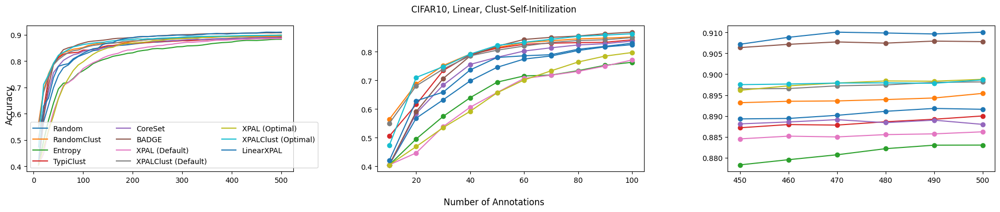

In [8]:
n_init=10
acq_size=10
n_acq=49


for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.RandomClust.value, Strategy.RandomClust.value, n_init, acq_size, n_acq),
        "Entropy": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "TypiClust": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq),
        "CoreSet": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "BADGE": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.BADGE.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "XPAL (Default)": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="default"),
        "XPALClust (Default)": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="default"),
        "XPAL (Optimal)": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
        "XPALClust (Optimal)": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="optimal"),
        "LinearXPAL": create_new_results_path(Dataset.CIFAR10.value, model, Strategy.LinearXPAL_100.value, Strategy.Random.value, n_init, acq_size, n_acq),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    if model == "pwc":
        del experiments["LinearXPAL"]

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"CIFAR10, {model_name}, Clust-Self-Initilization", save=False, savePath="", plot_std=False, xlim=[None, (10, 100), (450, 500)])
    except FileNotFoundError as e:
        print(e)

### SVHN Hyperparameters

100%|██████████| 7/7 [00:12<00:00,  1.80s/it]


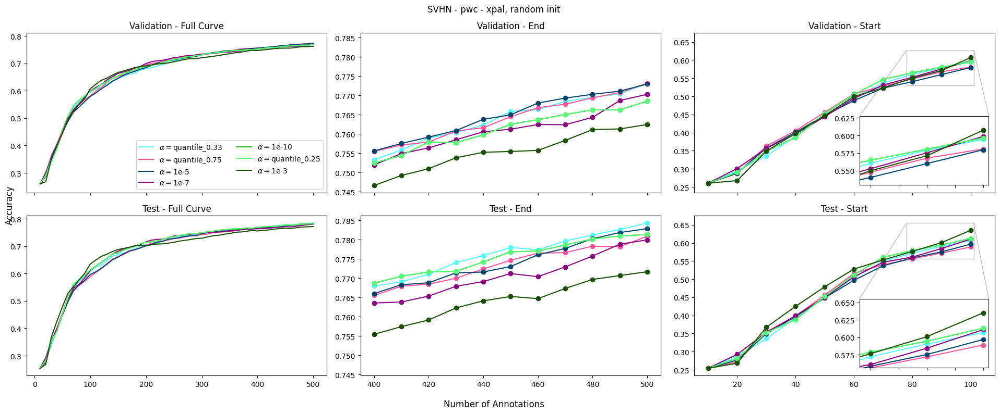

-- Performance INFO --
Max final validation accuracy: 0.773 reached with alpha=quantile_0.33
Max final validation accuracy after 100 samples: 0.607 reached with alpha=1e-3
Max validation AUC: 0.668 reached with alpha=1e-7
Max early validation AUC: 0.453 reached with alpha=1e-10

-- ALPHA - INFO --
$\alpha=$quantile_0.33 -> 4.613e-10 (± 7.44e-13)
$\alpha=$1e-7 -> 1.000e-07 (± 0.00e+00)
$\alpha=$1e-3 -> 1.000e-03 (± 0.00e+00)


In [24]:
evaluate_experiments(dataset=Dataset.SVHN.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [97]:
get_hyperparameter_papaer_statistics(dataset=Dataset.SVHN.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [02:16<00:00,  4.69s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.7730 reached with alpha=1e-5
Max custom max validation accuracy: 0.7732 reached with alpha=quantile_0.33
Max baseline max validation accuracy: 0.7625 reached with alpha=1e-3
Max predefined validation AUC: 0.6675 reached with alpha=1e-7
Max predefined validation AUC: 0.6662 reached with alpha=quantile_0.75
Max baseline validation AUC: 0.6625 reached with alpha=1e-3


100%|██████████| 29/29 [00:58<00:00,  2.02s/it]


Max predefined max test accuracy: 0.7829
Max custom max test accuracy: 0.7843
Max baseline max test accuracy: 0.7717
Max predefined test AUC: 0.6796
Max predefined test AUC: 0.6739
Max baseline test AUC: 0.6764

-- ALPHA - INFO --
alpha=quantile_0.33-> 4.613e-10 (± 7.44e-13)
alpha=quantile_0.75-> 3.512e-07 (± 4.66e-10)


100%|██████████| 9/9 [00:16<00:00,  1.79s/it]


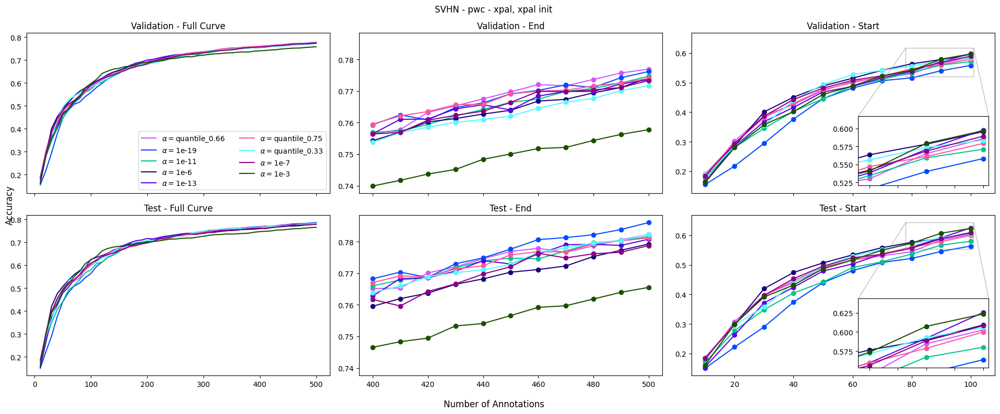

-- Performance INFO --
Max final validation accuracy: 0.777 reached with alpha=quantile_0.66
Max final validation accuracy after 100 samples: 0.606 reached with alpha=1e-2
Max validation AUC: 0.670 reached with alpha=1e-6
Max early validation AUC: 0.461 reached with alpha=1e-6

-- ALPHA - INFO --
$\alpha=$quantile_0.66 -> 7.610e-08 (± 7.11e-11)
$\alpha=$1e-6 -> 1.000e-06 (± 0.00e+00)


In [25]:
evaluate_experiments(dataset=Dataset.SVHN.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [98]:
get_hyperparameter_papaer_statistics(dataset=Dataset.SVHN.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [02:07<00:00,  4.41s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.7762 reached with alpha=1e-19
Max custom max validation accuracy: 0.7769 reached with alpha=quantile_0.66
Max baseline max validation accuracy: 0.7577 reached with alpha=1e-3
Max predefined validation AUC: 0.6695 reached with alpha=1e-6
Max predefined validation AUC: 0.6673 reached with alpha=quantile_0.75
Max baseline validation AUC: 0.6585 reached with alpha=1e-3


100%|██████████| 29/29 [00:58<00:00,  2.03s/it]


Max predefined max test accuracy: 0.7861
Max custom max test accuracy: 0.7823
Max baseline max test accuracy: 0.7655
Max predefined test AUC: 0.6793
Max predefined test AUC: 0.6776
Max baseline test AUC: 0.6708

-- ALPHA - INFO --
alpha=quantile_0.66-> 7.610e-08 (± 7.11e-11)
alpha=quantile_0.75-> 3.512e-07 (± 4.66e-10)


100%|██████████| 5/5 [00:08<00:00,  1.75s/it]


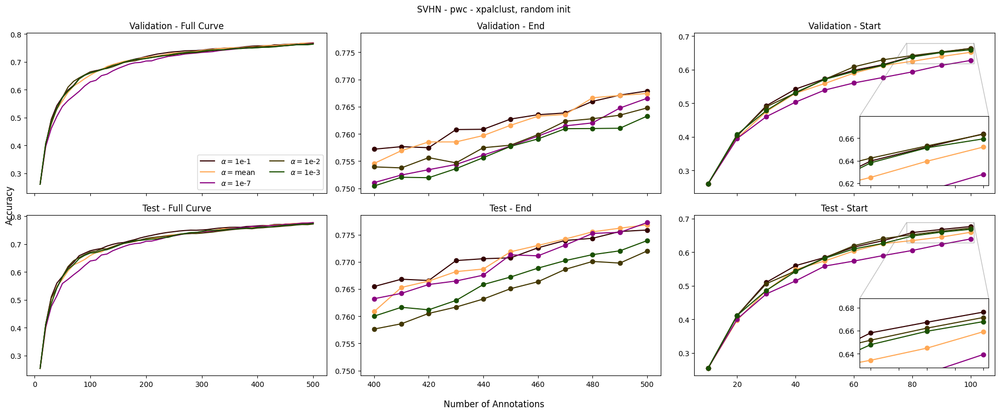

-- Performance INFO --
Max final validation accuracy: 0.768 reached with alpha=1e-1
Max final validation accuracy after 100 samples: 0.664 reached with alpha=1e-1
Max validation AUC: 0.697 reached with alpha=1e-1
Max early validation AUC: 0.545 reached with alpha=1e-2

-- ALPHA - INFO --
$\alpha=$1e-1 -> 1.000e-01 (± 0.00e+00)


In [26]:
evaluate_experiments(dataset=Dataset.SVHN.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [99]:
get_hyperparameter_papaer_statistics(dataset=Dataset.SVHN.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [02:16<00:00,  4.71s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.7679 reached with alpha=1e-1
Max custom max validation accuracy: 0.7674 reached with alpha=mean
Max baseline max validation accuracy: 0.7633 reached with alpha=1e-3
Max predefined validation AUC: 0.6975 reached with alpha=1e-1
Max predefined validation AUC: 0.6942 reached with alpha=mean
Max baseline validation AUC: 0.6929 reached with alpha=1e-3


100%|██████████| 29/29 [00:58<00:00,  2.01s/it]


Max predefined max test accuracy: 0.7758
Max custom max test accuracy: 0.7768
Max baseline max test accuracy: 0.7739
Max predefined test AUC: 0.7073
Max predefined test AUC: 0.6998
Max baseline test AUC: 0.6995

-- ALPHA - INFO --
alpha=mean-> 2.785e-04 (± 4.09e-07)


100%|██████████| 5/5 [00:08<00:00,  1.77s/it]


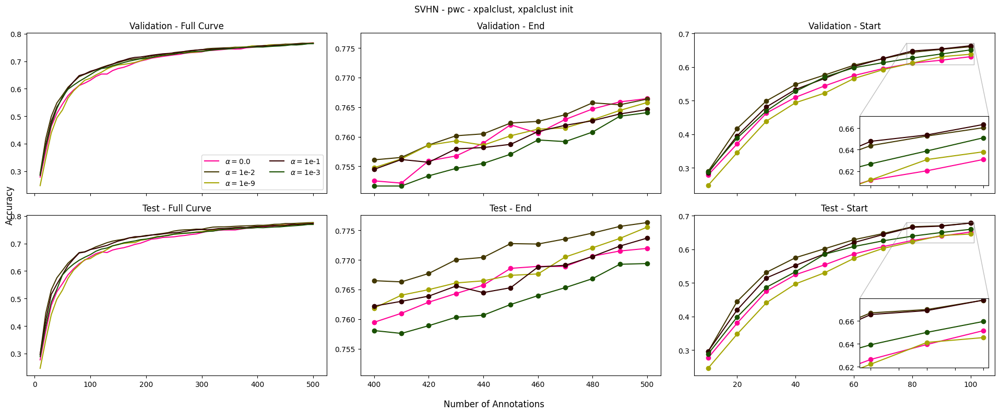

-- Performance INFO --
Max final validation accuracy: 0.766 reached with alpha=0.0
Max final validation accuracy after 100 samples: 0.663 reached with alpha=1e-1
Max validation AUC: 0.698 reached with alpha=1e-2
Max early validation AUC: 0.552 reached with alpha=1e-2

-- ALPHA - INFO --
$\alpha=$0.0 -> 0.000e+00 (± 0.00e+00)
$\alpha=$1e-2 -> 1.000e-02 (± 0.00e+00)
$\alpha=$1e-1 -> 1.000e-01 (± 0.00e+00)


In [27]:
evaluate_experiments(dataset=Dataset.SVHN.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [100]:
get_hyperparameter_papaer_statistics(dataset=Dataset.SVHN.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 29/29 [02:01<00:00,  4.17s/it]


-- Performance INFO --
Max predefined max validation accuracy: 0.7664 reached with alpha=0.0
Max custom max validation accuracy: 0.7658 reached with alpha=quantile_0.33
Max baseline max validation accuracy: 0.7641 reached with alpha=1e-3
Max predefined validation AUC: 0.6982 reached with alpha=1e-2
Max predefined validation AUC: 0.6898 reached with alpha=mean
Max baseline validation AUC: 0.6917 reached with alpha=1e-3


100%|██████████| 29/29 [00:58<00:00,  2.02s/it]


Max predefined max test accuracy: 0.7719
Max custom max test accuracy: 0.7767
Max baseline max test accuracy: 0.7694
Max predefined test AUC: 0.7129
Max predefined test AUC: 0.6939
Max baseline test AUC: 0.6986

-- ALPHA - INFO --
alpha=quantile_0.33-> 4.613e-10 (± 7.44e-13)
alpha=mean-> 2.785e-04 (± 4.09e-07)


100%|██████████| 8/8 [00:14<00:00,  1.76s/it]


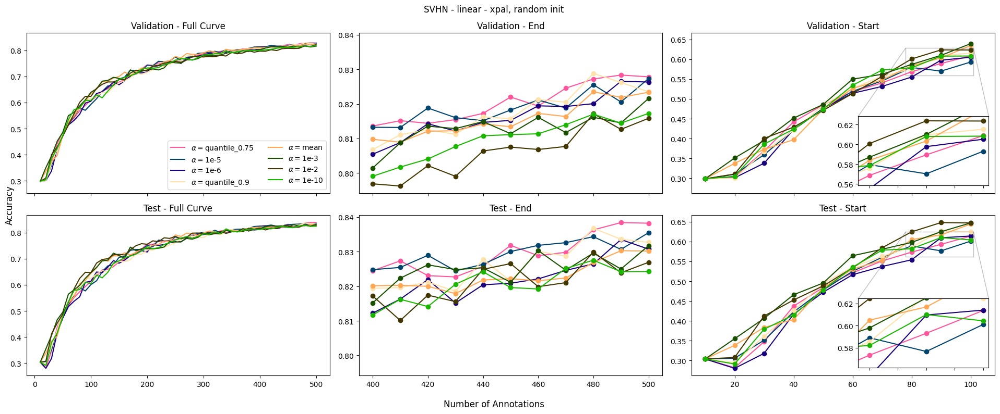

-- Performance INFO --
Max final validation accuracy: 0.828 reached with alpha=quantile_0.75
Max final validation accuracy after 100 samples: 0.639 reached with alpha=1e-3
Max validation AUC: 0.713 reached with alpha=mean
Max early validation AUC: 0.493 reached with alpha=1e-3

-- ALPHA - INFO --
$\alpha=$quantile_0.75 -> 3.512e-07 (± 4.66e-10)
$\alpha=$mean -> 2.785e-04 (± 4.09e-07)
$\alpha=$1e-3 -> 1.000e-03 (± 0.00e+00)


In [28]:
evaluate_experiments(dataset=Dataset.SVHN.value, model=Model.Linear.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [101]:
get_hyperparameter_papaer_statistics(dataset=Dataset.Linear.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

AttributeError: Linear

100%|██████████| 8/8 [00:14<00:00,  1.76s/it]


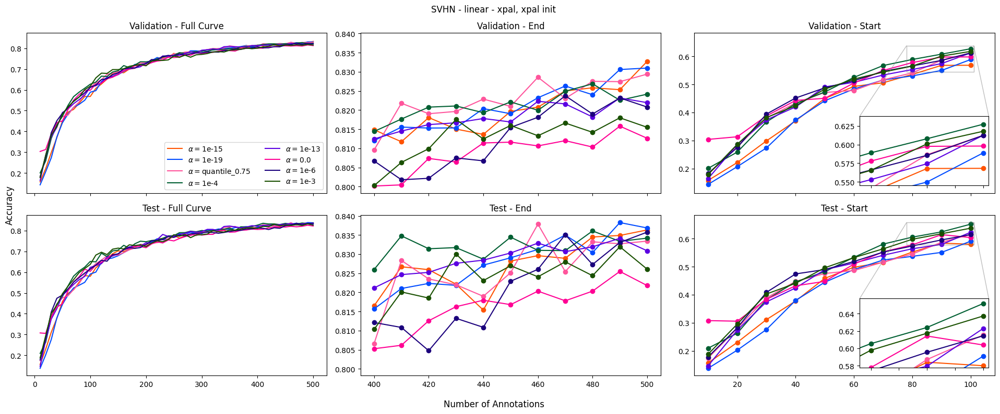

-- Performance INFO --
Max final validation accuracy: 0.833 reached with alpha=1e-15
Max final validation accuracy after 100 samples: 0.634 reached with alpha=1e-2
Max validation AUC: 0.710 reached with alpha=1e-4
Max early validation AUC: 0.473 reached with alpha=0.0

-- ALPHA - INFO --
$\alpha=$1e-15 -> 1.000e-15 (± 0.00e+00)
$\alpha=$1e-4 -> 1.000e-04 (± 0.00e+00)


In [29]:
evaluate_experiments(dataset=Dataset.SVHN.value, model=Model.Linear.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [ ]:
get_hyperparameter_papaer_statistics(dataset=Dataset.Linear.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 8/8 [00:14<00:00,  1.79s/it]


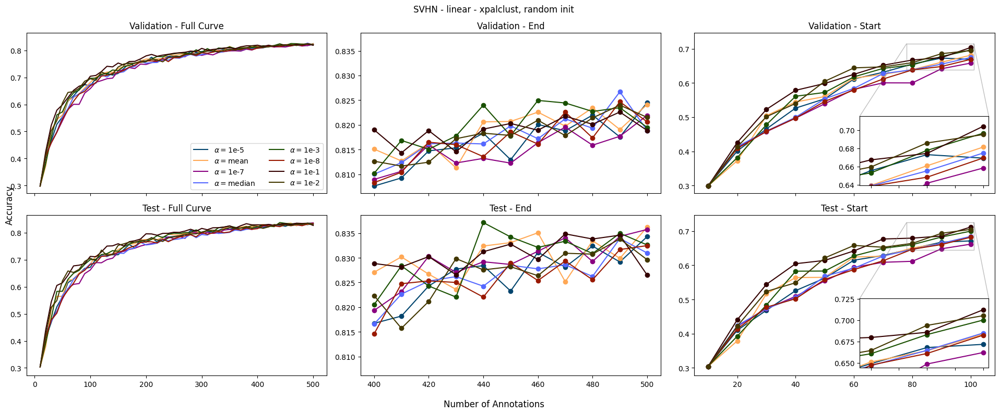

-- Performance INFO --
Max final validation accuracy: 0.825 reached with alpha=1e-5
Max final validation accuracy after 100 samples: 0.704 reached with alpha=1e-1
Max validation AUC: 0.748 reached with alpha=1e-1
Max early validation AUC: 0.575 reached with alpha=1e-1

-- ALPHA - INFO --
$\alpha=$1e-5 -> 1.000e-05 (± 0.00e+00)
$\alpha=$1e-1 -> 1.000e-01 (± 0.00e+00)


In [30]:
evaluate_experiments(dataset=Dataset.SVHN.value, model=Model.Linear.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [ ]:
get_hyperparameter_papaer_statistics(dataset=Dataset.Linear.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.Random.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


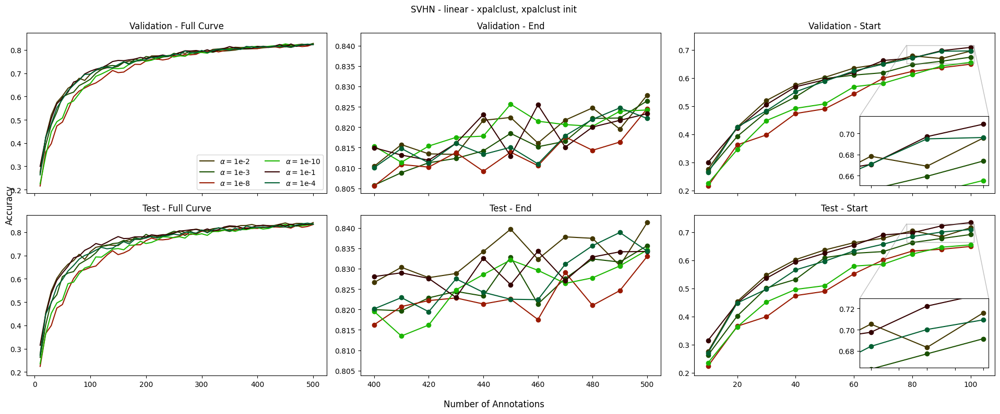

-- Performance INFO --
Max final validation accuracy: 0.828 reached with alpha=1e-2
Max final validation accuracy after 100 samples: 0.709 reached with alpha=1e-1
Max validation AUC: 0.746 reached with alpha=1e-1
Max early validation AUC: 0.575 reached with alpha=1e-1

-- ALPHA - INFO --
$\alpha=$1e-2 -> 1.000e-02 (± 0.00e+00)
$\alpha=$1e-1 -> 1.000e-01 (± 0.00e+00)


In [31]:
evaluate_experiments(dataset=Dataset.SVHN.value, model=Model.Linear.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [ ]:
get_hyperparameter_papaer_statistics(dataset=Dataset.Linear.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=10, acq_size=10, n_acq=49, kernel="rbf", gamma="calculate")

100%|██████████| 7/7 [01:24<00:00, 12.10s/it]


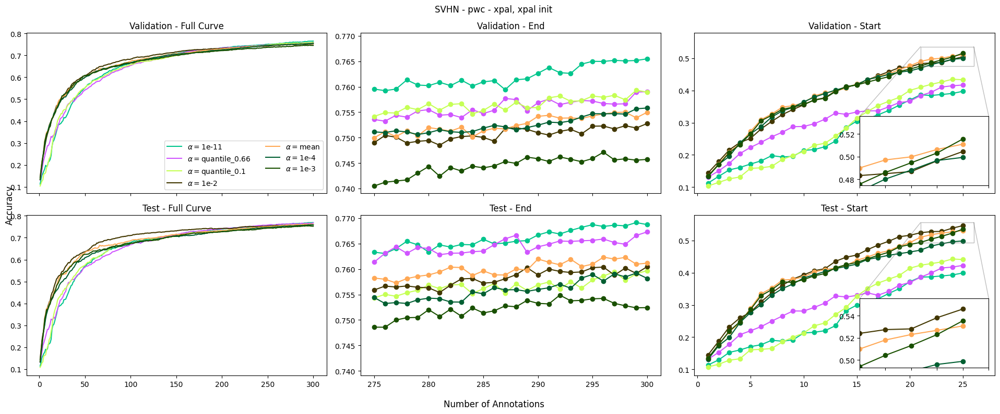

-- Performance INFO --
Max final validation accuracy: 0.765 reached with alpha=1e-11
Max final validation accuracy after 100 samples: 0.683 reached with alpha=1e-2
Max validation AUC: 0.673 reached with alpha=1e-2
Max early validation AUC: 0.380 reached with alpha=mean

-- ALPHA - INFO --
$\alpha=$1e-11 -> 1.000e-11 (± 0.00e+00)
$\alpha=$1e-2 -> 1.000e-02 (± 0.00e+00)


In [32]:
evaluate_experiments(dataset=Dataset.SVHN.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [ ]:
get_hyperparameter_papaer_statistics(dataset=Dataset.PWC.value, model=Model.PWC.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate")

100%|██████████| 5/5 [00:59<00:00, 11.98s/it]


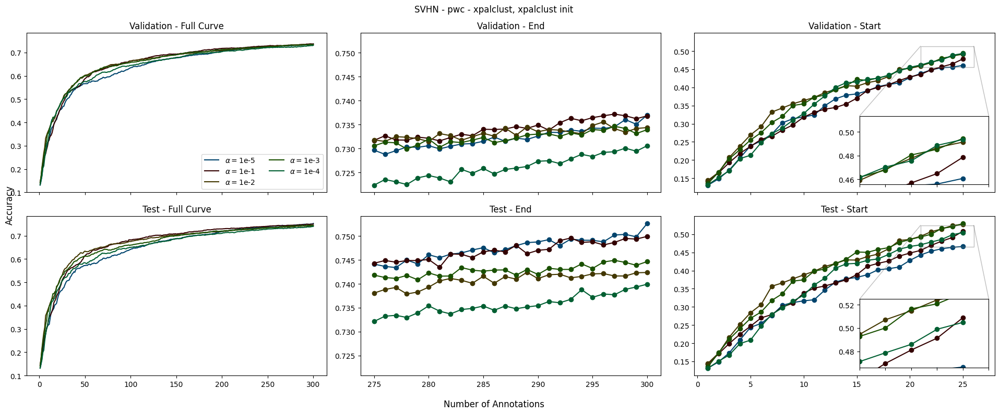

-- Performance INFO --
Max final validation accuracy: 0.737 reached with alpha=1e-5
Max final validation accuracy after 100 samples: 0.663 reached with alpha=1e-1
Max validation AUC: 0.655 reached with alpha=1e-2
Max early validation AUC: 0.369 reached with alpha=1e-2

-- ALPHA - INFO --
$\alpha=$1e-5 -> 1.000e-05 (± 0.00e+00)
$\alpha=$1e-1 -> 1.000e-01 (± 0.00e+00)
$\alpha=$1e-2 -> 1.000e-02 (± 0.00e+00)


In [33]:
evaluate_experiments(dataset=Dataset.SVHN.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [ ]:
get_hyperparameter_papaer_statistics(dataset=Dataset.PWC.value, model=Model.PWC.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate")

100%|██████████| 9/9 [01:50<00:00, 12.27s/it]


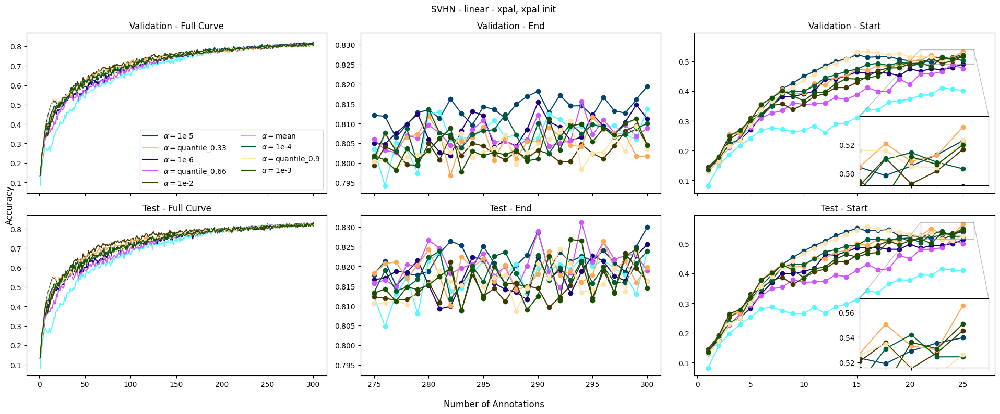

-- Performance INFO --
Max final validation accuracy: 0.819 reached with alpha=1e-5
Max final validation accuracy after 100 samples: 0.714 reached with alpha=1e-1
Max validation AUC: 0.712 reached with alpha=1e-2
Max early validation AUC: 0.425 reached with alpha=quantile_0.9

-- ALPHA - INFO --
$\alpha=$1e-5 -> 1.000e-05 (± 0.00e+00)
$\alpha=$1e-2 -> 1.000e-02 (± 0.00e+00)


In [34]:
evaluate_experiments(dataset=Dataset.SVHN.value, model=Model.Linear.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [ ]:
get_hyperparameter_papaer_statistics(dataset=Dataset.PWC.value, model=Model.Linear.value, al_strategy=Strategy.XPAL.value, init_strategy=Strategy.XPAL.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate")

100%|██████████| 9/9 [01:49<00:00, 12.18s/it]


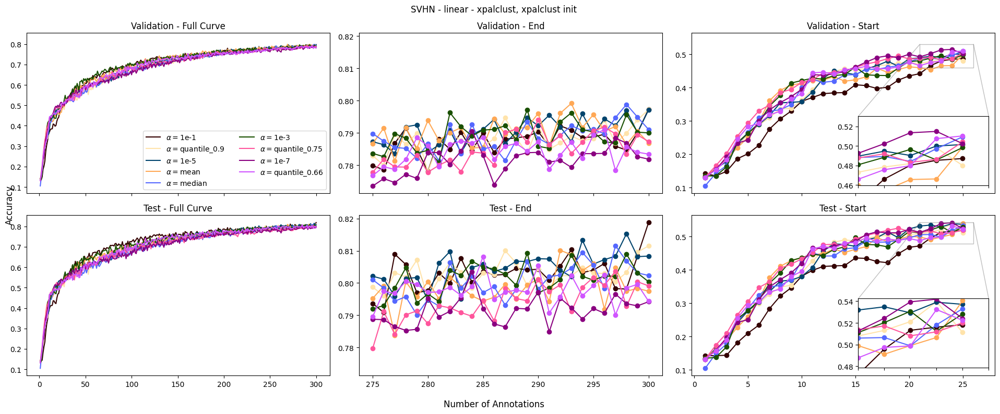

-- Performance INFO --
Max final validation accuracy: 0.797 reached with alpha=1e-1
Max final validation accuracy after 100 samples: 0.697 reached with alpha=1e-1
Max validation AUC: 0.696 reached with alpha=1e-3
Max early validation AUC: 0.401 reached with alpha=quantile_0.75

-- ALPHA - INFO --
$\alpha=$1e-1 -> 1.000e-01 (± 0.00e+00)
$\alpha=$1e-3 -> 1.000e-03 (± 0.00e+00)


In [35]:
evaluate_experiments(dataset=Dataset.SVHN.value, model=Model.Linear.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate", force_alpha="1e-3")

In [ ]:
get_hyperparameter_papaer_statistics(dataset=Dataset.PWC.value, model=Model.Linear.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=1, acq_size=1, n_acq=299, kernel="rbf", gamma="calculate")

### SVHN AL Plots

100%|██████████| 10/10 [06:39<00:00, 39.95s/it]


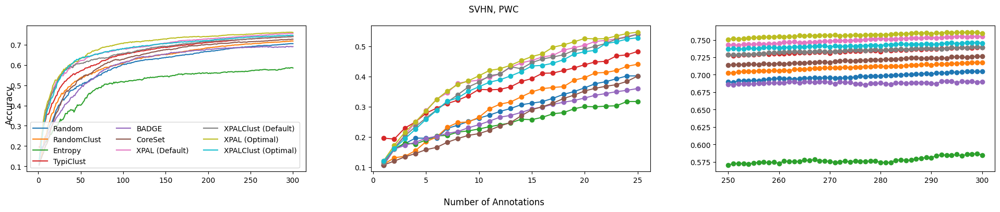

100%|██████████| 10/10 [04:18<00:00, 25.80s/it]


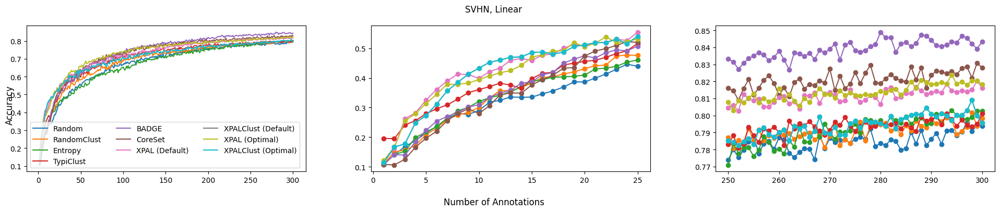

In [15]:
n_init=1
acq_size=1
n_acq=299


for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random": create_new_results_path(Dataset.SVHN.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.SVHN.value, model, Strategy.RandomClust.value, Strategy.RandomClust.value, n_init, acq_size, n_acq),
        "Entropy": create_new_results_path(Dataset.SVHN.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "TypiClust": create_new_results_path(Dataset.SVHN.value, model, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq),
        "BADGE": create_new_results_path(Dataset.SVHN.value, model, Strategy.BADGE.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "CoreSet": create_new_results_path(Dataset.SVHN.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "XPAL (Default)": create_new_results_path(Dataset.SVHN.value, model, Strategy.XPAL.value, Strategy.XPAL.value, n_init, acq_size, n_acq, suffix="default"),
        "XPALClust (Default)": create_new_results_path(Dataset.SVHN.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="default"),
        "XPAL (Optimal)": create_new_results_path(Dataset.SVHN.value, model, Strategy.XPAL.value, Strategy.XPAL.value, n_init, acq_size, n_acq, suffix="optimal"),
        "XPALClust (Optimal)": create_new_results_path(Dataset.SVHN.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="optimal"),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"SVHN, {model_name}", save=False, savePath="", plot_std=False, xlim=[None, (1, 25), (250, 300)])
    except FileNotFoundError as e:
        print(e)

100%|██████████| 10/10 [00:42<00:00,  4.25s/it]


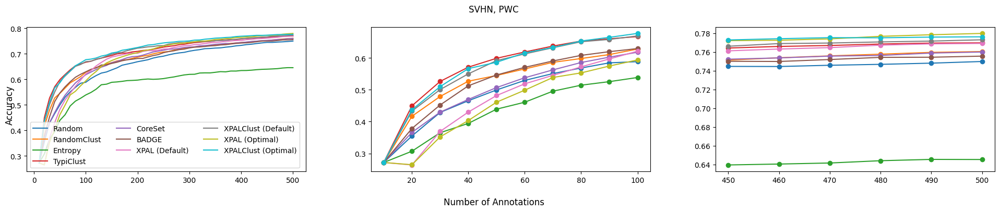

100%|██████████| 10/10 [00:41<00:00,  4.10s/it]


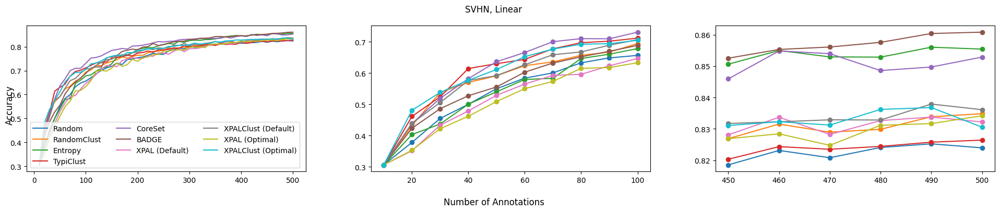

In [13]:
n_init=10
acq_size=10
n_acq=49


for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random": create_new_results_path(Dataset.SVHN.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.SVHN.value, model, Strategy.RandomClust.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "Entropy": create_new_results_path(Dataset.SVHN.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "TypiClust": create_new_results_path(Dataset.SVHN.value, model, Strategy.TypiClust.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "CoreSet": create_new_results_path(Dataset.SVHN.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "BADGE": create_new_results_path(Dataset.SVHN.value, model, Strategy.BADGE.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "XPAL (Default)": create_new_results_path(Dataset.SVHN.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="default"),
        "XPALClust (Default)": create_new_results_path(Dataset.SVHN.value, model, Strategy.XPALClust.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="default"),
        "XPAL (Optimal)": create_new_results_path(Dataset.SVHN.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
        "XPALClust (Optimal)": create_new_results_path(Dataset.SVHN.value, model, Strategy.XPALClust.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"SVHN, {model_name}", save=False, savePath="", plot_std=False, xlim=[None, (10, 100), (450, 500)])
    except FileNotFoundError as e:
        print(e)

100%|██████████| 10/10 [00:41<00:00,  4.14s/it]


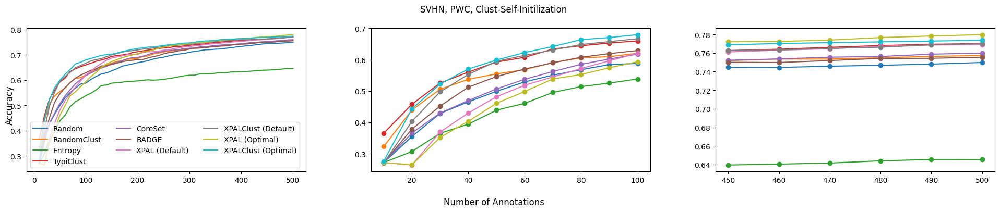

100%|██████████| 10/10 [00:40<00:00,  4.03s/it]


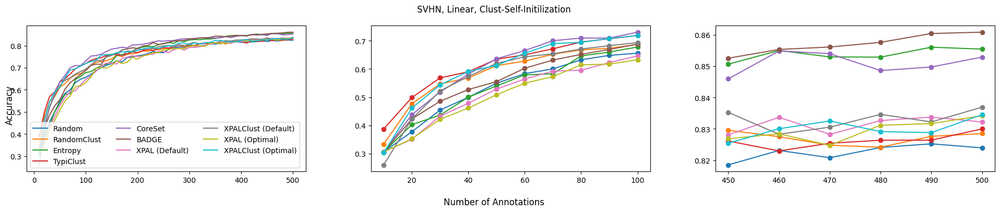

In [14]:
n_init=10
acq_size=10
n_acq=49


for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random": create_new_results_path(Dataset.SVHN.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.SVHN.value, model, Strategy.RandomClust.value, Strategy.RandomClust.value, n_init, acq_size, n_acq),
        "Entropy": create_new_results_path(Dataset.SVHN.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "TypiClust": create_new_results_path(Dataset.SVHN.value, model, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq),
        "CoreSet": create_new_results_path(Dataset.SVHN.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "BADGE": create_new_results_path(Dataset.SVHN.value, model, Strategy.BADGE.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "XPAL (Default)": create_new_results_path(Dataset.SVHN.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="default"),
        "XPALClust (Default)": create_new_results_path(Dataset.SVHN.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="default"),
        "XPAL (Optimal)": create_new_results_path(Dataset.SVHN.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
        "XPALClust (Optimal)": create_new_results_path(Dataset.SVHN.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="optimal"),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"SVHN, {model_name}, Clust-Self-Initilization", save=False, savePath="", plot_std=False, xlim=[None, (10, 100), (450, 500)])
    except FileNotFoundError as e:
        print(e)

### CIFAR100 Hyperparameters

100%|██████████| 6/6 [00:02<00:00,  2.25it/s]


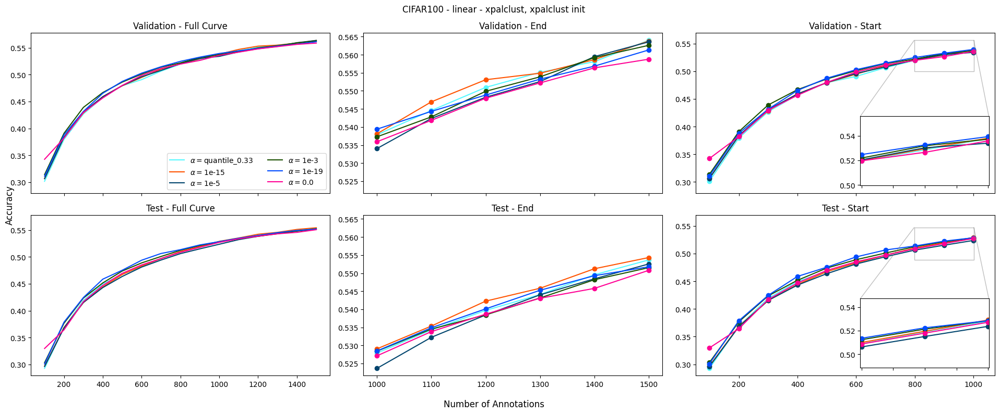

-- Performance INFO --
Max final validation accuracy: 0.564 reached with alpha=quantile_0.33
Max final validation accuracy after 100 samples: 0.342 reached with alpha=0.0
Max validation AUC: 0.498 reached with alpha=1e-3
Max early validation AUC: 0.470 reached with alpha=1e-3

-- ALPHA - INFO --
$\alpha=$quantile_0.33 -> 6.211e-09 (± 1.30e-10)
$\alpha=$1e-3 -> 1.000e-03 (± 0.00e+00)
$\alpha=$0.0 -> 0.000e+00 (± 0.00e+00)


In [24]:
evaluate_experiments(dataset=Dataset.CIFAR100.value, model=Model.Linear.value, al_strategy=Strategy.XPALClust.value, init_strategy=Strategy.XPALClust.value, n_init=100, acq_size=100, n_acq=14, kernel="rbf", gamma="calculate", force_alpha="1e-3")

### CIFAR100 AL Plots

100%|██████████| 8/8 [02:18<00:00, 17.31s/it]


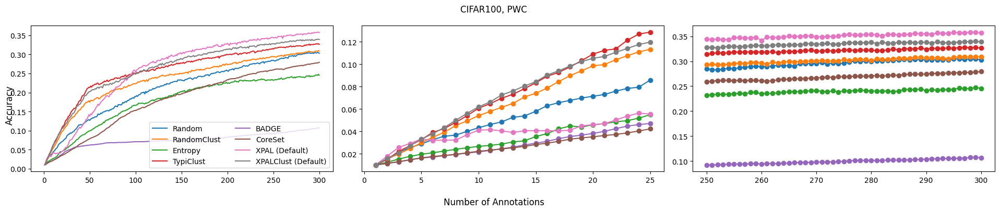

100%|██████████| 8/8 [03:13<00:00, 24.19s/it]


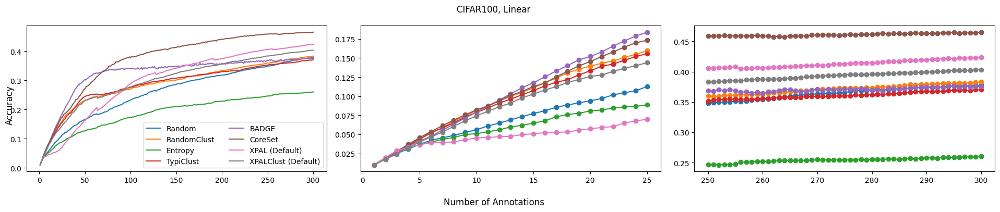

In [7]:
n_init=1
acq_size=1
n_acq=299


for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.RandomClust.value, Strategy.RandomClust.value, n_init, acq_size, n_acq),
        "Entropy": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
         "TypiClust": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq),
        "BADGE": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.BADGE.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "CoreSet": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "XPAL (Default)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPAL.value, Strategy.XPAL.value, n_init, acq_size, n_acq, suffix="default"),
        "XPALClust (Default)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="default"),
        #"XPAL (Optimal)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPAL.value, Strategy.XPAL.value, n_init, acq_size, n_acq, suffix="optimal"),
        #"XPALClust (Optimal)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="optimal"),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"CIFAR100, {model_name}", save=False, savePath="", plot_std=False, xlim=[None, (1, 25), (250, 300)])
    except FileNotFoundError as e:
        print(e)

100%|██████████| 8/8 [00:07<00:00,  1.05it/s]


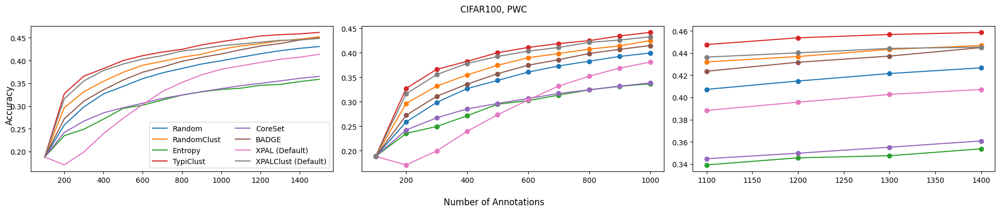

100%|██████████| 8/8 [00:21<00:00,  2.75s/it]


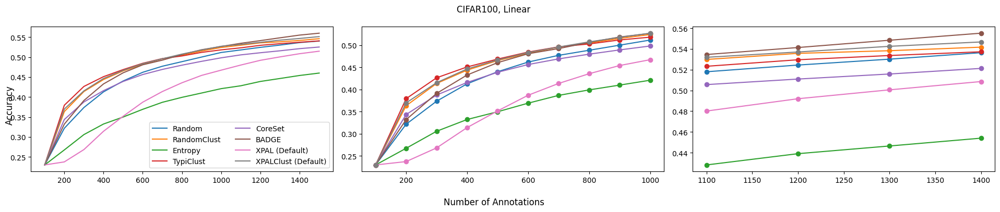

In [38]:
n_init=100
acq_size=100
n_acq=14


for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.RandomClust.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "Entropy": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "TypiClust": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.TypiClust.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "CoreSet": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "BADGE": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.BADGE.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "XPAL (Default)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="default"),
        "XPALClust (Default)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPALClust.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="default"),
        #"XPAL (Optimal)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
        #"XPALClust (Optimal)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPALClust.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"CIFAR100, {model_name}", save=False, savePath="", plot_std=False, xlim=[None, (100, 1000), (1100, 1400)])
    except FileNotFoundError as e:
        print(e)

100%|██████████| 8/8 [00:06<00:00,  1.21it/s]


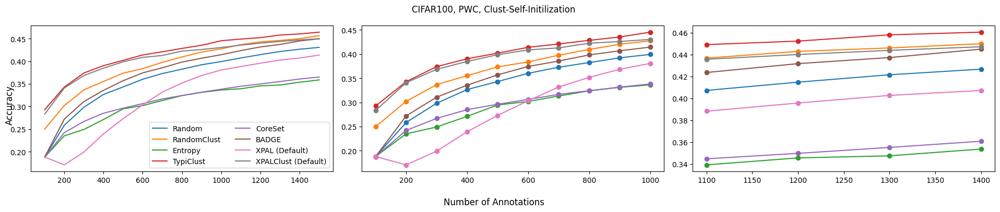

100%|██████████| 8/8 [00:06<00:00,  1.21it/s]


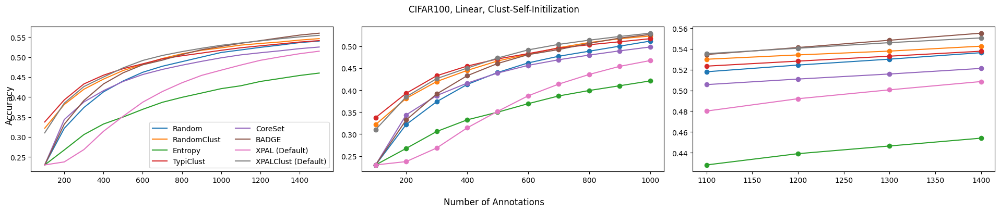

In [42]:
n_init=100
acq_size=100
n_acq=14


for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.RandomClust.value, Strategy.RandomClust.value, n_init, acq_size, n_acq),
        "Entropy": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "TypiClust": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq),
        "CoreSet": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "BADGE": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.BADGE.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "XPAL (Default)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="default"),
        "XPALClust (Default)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="default"),
        #"XPAL (Optimal)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
        #"XPALClust (Optimal)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="optimal"),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"CIFAR100, {model_name}, Clust-Self-Initilization", save=False, savePath="", plot_std=False, xlim=[None, (100, 1000), (1100, 1400)])
    except FileNotFoundError as e:
        print(e)

### ImageNet100 AL Plots

100%|██████████| 8/8 [01:13<00:00,  9.22s/it]


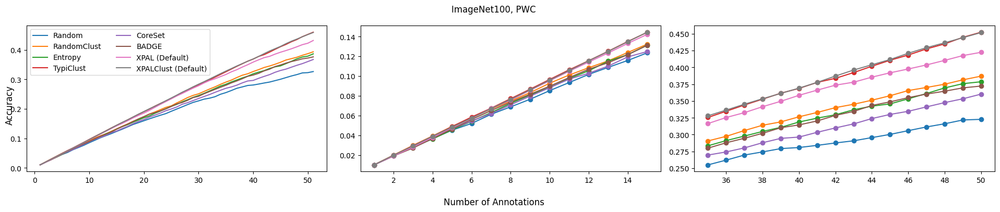

100%|██████████| 8/8 [01:03<00:00,  7.99s/it]


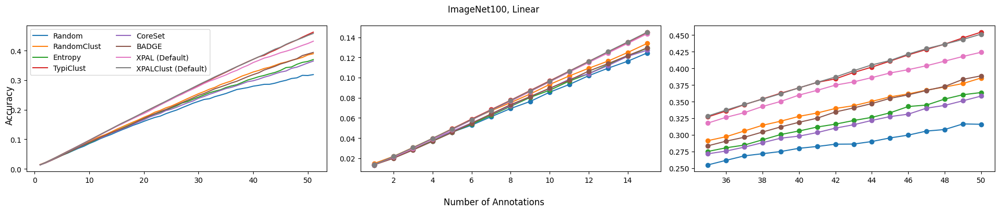

In [20]:
n_init=1
acq_size=1
n_acq=50


for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.RandomClust.value, Strategy.RandomClust.value, n_init, acq_size, n_acq),
        "Entropy": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "TypiClust": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq),
        "CoreSet": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "BADGE": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.BADGE.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "XPAL (Default)": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.XPAL.value, Strategy.XPAL.value, n_init, acq_size, n_acq, suffix="default"),
        "XPALClust (Default)": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="default"),
        #"XPAL (Optimal)": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
        #"XPALClust (Optimal)": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.XPALClust.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"ImageNet100, {model_name}", save=False, savePath="", plot_std=False, xlim=[None, (1, 15), (35, 50)])
    except FileNotFoundError as e:
        print(e)

100%|██████████| 8/8 [00:22<00:00,  2.83s/it]


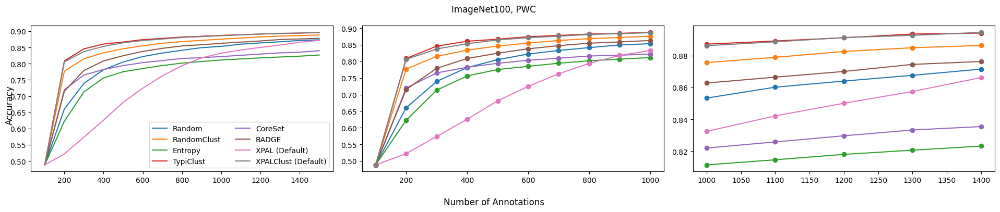

100%|██████████| 8/8 [00:23<00:00,  2.88s/it]


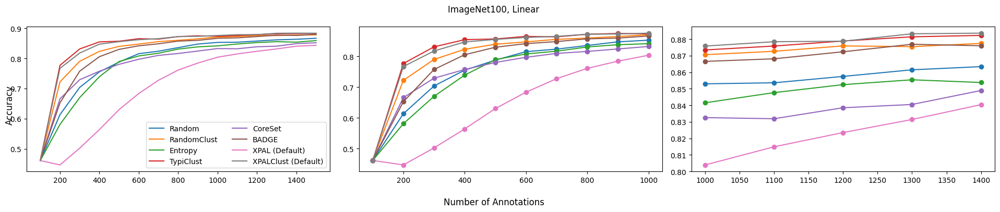

In [21]:
n_init=100
acq_size=100
n_acq=14


for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.RandomClust.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "Entropy": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "TypiClust": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.TypiClust.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "CoreSet": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "BADGE": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.BADGE.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "XPAL (Default)": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="default"),
        "XPALClust (Default)": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.XPALClust.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="default"),
        #"XPAL (Optimal)": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
        #"XPALClust (Optimal)": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.XPALClust.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"ImageNet100, {model_name}", save=False, savePath="", plot_std=False, xlim=[None, (100, 1000), (1000, 1400)])
    except FileNotFoundError as e:
        print(e)

100%|██████████| 8/8 [00:21<00:00,  2.70s/it]


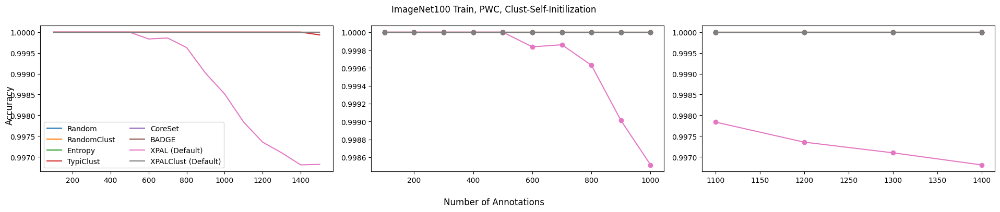

100%|██████████| 8/8 [00:16<00:00,  2.06s/it]


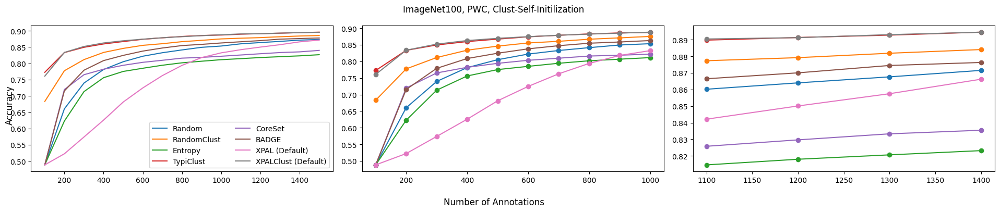

100%|██████████| 8/8 [00:21<00:00,  2.75s/it]


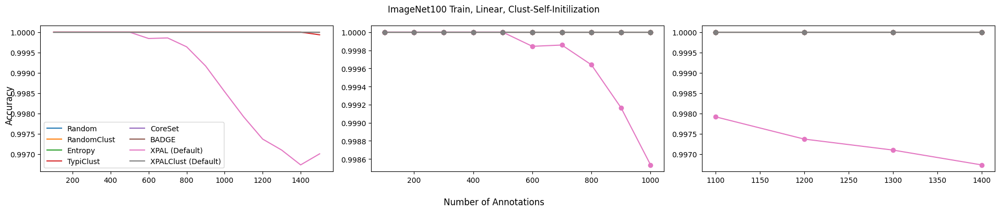

100%|██████████| 8/8 [00:16<00:00,  2.08s/it]


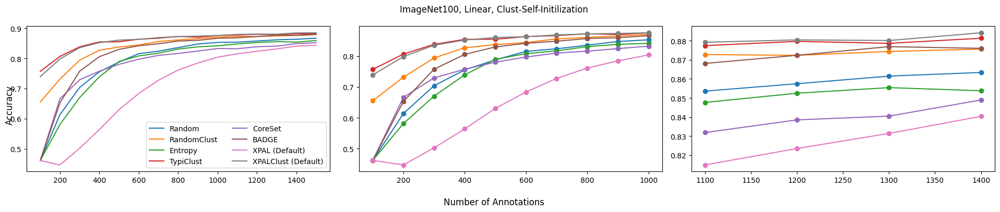

<function __main__.generate_learning_curves(experiments, stats='test_stats', deprecated=False, print_progress=False)>

In [23]:
n_init=100
acq_size=100
n_acq=14


for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.RandomClust.value, Strategy.RandomClust.value, n_init, acq_size, n_acq),
        "Entropy": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "TypiClust": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq),
        "CoreSet": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "BADGE": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.BADGE.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "XPAL (Default)": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="default"),
        "XPALClust (Default)": create_new_results_path(Dataset.ImageNet100.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="default"),
        #"XPAL (Optimal)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPAL.value, Strategy.Random.value, n_init, acq_size, n_acq, suffix="optimal"),
        #"XPALClust (Optimal)": create_new_results_path(Dataset.CIFAR100.value, model, Strategy.XPALClust.value, Strategy.XPALClust.value, n_init, acq_size, n_acq, suffix="optimal"),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments,  stats="train_stats"), title = f"ImageNet100 Train, {model_name}, Clust-Self-Initilization", save=False, savePath="", plot_std=False, xlim=[None, (100, 1000), (1100, 1400)])
        plot_learning_curves(generate_learning_curves(experiments, stats="test_stats"), title = f"ImageNet100, {model_name}, Clust-Self-Initilization", save=False, savePath="", plot_std=False, xlim=[None, (100, 1000), (1100, 1400)])
    except FileNotFoundError as e:
        print(e)


evaluate_experiments

generate_learning_curves

### Fintuning

100%|██████████| 37/37 [01:08<00:00,  1.84s/it]


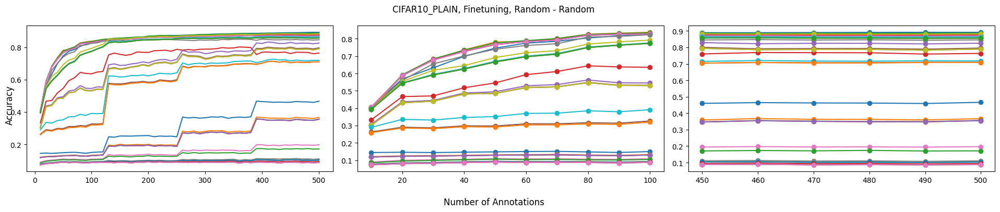

100%|██████████| 37/37 [01:06<00:00,  1.81s/it]


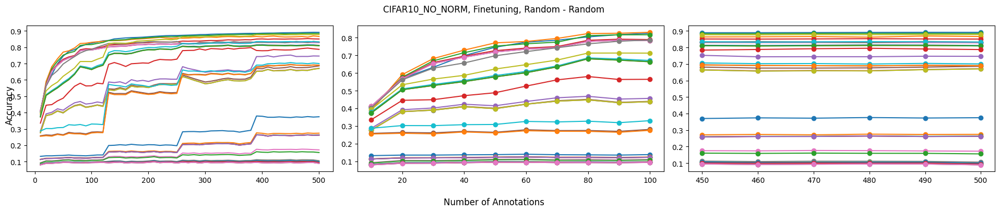

100%|██████████| 37/37 [01:14<00:00,  2.00s/it]


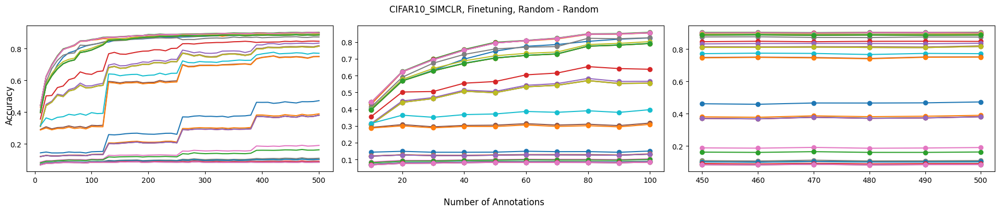

In [7]:
n_init=10
acq_size=10
n_acq=49

dataset_array=("CIFAR10_PLAIN", "CIFAR10_NO_NORM", "CIFAR10_SIMCLR")
finetuning_lr_array=("0.1", "0.01", "0.001", "0.0001", "0.00001", "0.000001")
linear_lr_array=("0.1", "0.01", "0.001", "0.0001", "0.00001", "0.000001")

for dataset in dataset_array:
    iterator = itertools.product(linear_lr_array, finetuning_lr_array)
    experiments = {"Baseline": create_new_results_path(Dataset.CIFAR10.value, Model.Linear.value, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),}
    
    for linear_lr, finetuning_lr in iterator:
        experiments[f"{dataset}, LLR: {linear_lr}, FLR: {finetuning_lr}"] = finetuning_hparams_path(dataset,  Model.WR2810.value, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq, linear_lr, finetuning_lr)
    
    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"{dataset}, Finetuning, Random - Random", save=False, savePath="", plot_std=False, xlim=[None, (10, 100), (450, 500)], legend=False)
    except FileNotFoundError as e:
        print(e)

100%|██████████| 37/37 [00:51<00:00,  1.39s/it]


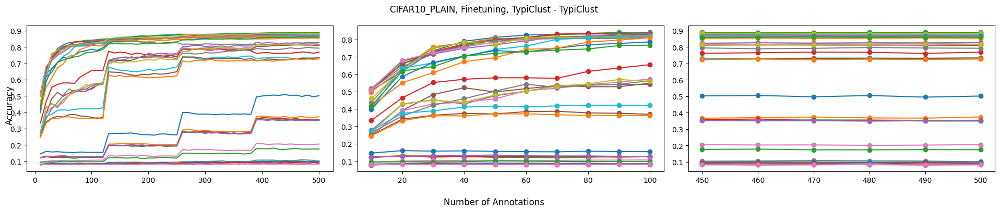

100%|██████████| 37/37 [01:03<00:00,  1.70s/it]


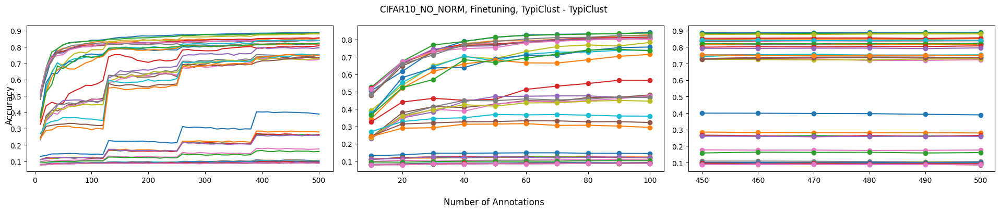

100%|██████████| 37/37 [00:55<00:00,  1.49s/it]


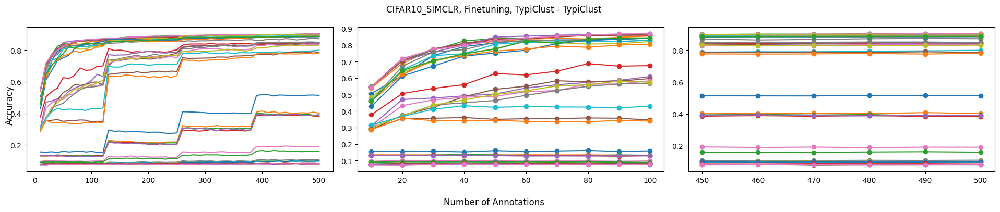

In [10]:
n_init=10
acq_size=10
n_acq=49

dataset_array=("CIFAR10_PLAIN", "CIFAR10_NO_NORM", "CIFAR10_SIMCLR")
linear_lr_array=("0.1", "0.01", "0.001", "0.0001", "0.00001", "0.000001")
finetuning_lr_array=("0.1", "0.01", "0.001", "0.0001", "0.00001", "0.000001")


for dataset in dataset_array:
    iterator = itertools.product(linear_lr_array, finetuning_lr_array)
    experiments = {"Baseline": create_new_results_path(Dataset.CIFAR10.value, Model.Linear.value, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq),}
    
    for linear_lr, finetuning_lr in iterator:
        experiments[f"{dataset}, LLR: {linear_lr}, FLR: {finetuning_lr}"] = finetuning_hparams_path(dataset,  Model.WR2810.value, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq, linear_lr, finetuning_lr)
    
    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"{dataset}, Finetuning, TypiClust - TypiClust", save=False, savePath="", plot_std=False, xlim=[None, (10, 100), (450, 500)], legend=False)
    except FileNotFoundError as e:
        print(e)

In [54]:
n_init=10
acq_size=10
n_acq=49

dataset_array=("CIFAR10_PLAIN", "CIFAR10_NO_NORM", "CIFAR10_SIMCLR")
linear_lr_array=("0.1", "0.01", "0.001", "0.0001", "0.00001", "0.000001")
finetuning_lr_array=("0.1", "0.01", "0.001", "0.0001", "0.00001", "0.000001")
iterator = itertools.product(dataset_array, linear_lr_array, finetuning_lr_array)
experiments = {"Baseline": create_new_results_path(Dataset.CIFAR10.value, Model.Linear.value, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),}

for dataset, linear_lr, finetuning_lr in iterator:
    experiments[f"{dataset}, LLR: {linear_lr}, FLR: {finetuning_lr}"] = finetuning_hparams_path(dataset,  Model.WR2810.value, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq, linear_lr, finetuning_lr)

random_lrs = generate_learning_curves(experiments)

100%|██████████| 109/109 [01:30<00:00,  1.21it/s]


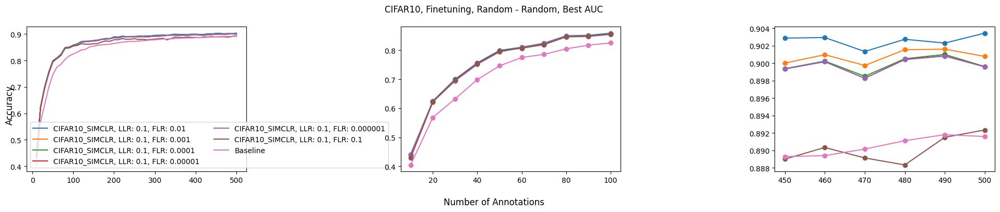

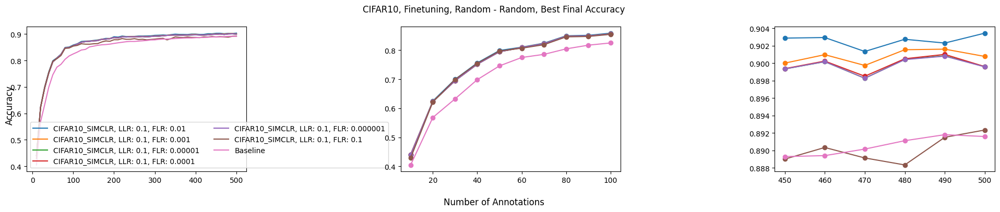

In [59]:
best_auc_learning_curves = sorted(random_lrs.items(), key=lambda x: x[1]["auc"], reverse=True)[:6]
best_auc_learning_curves.append(('Baseline', random_lrs["Baseline"]))
# best_auc_learning_curves.append(('test', random_lrs["CIFAR10_SIMCLR, LLR: 0.1, FLR: 0.1"]))

exps = {}
for exp in best_auc_learning_curves:
    exps[exp[0]] = exp[1]

plot_learning_curves(exps, title = f"CIFAR10, Finetuning, Random - Random, Best AUC", save=False, savePath="", plot_std=False, xlim=[None, (10, 100), (450, 500)])

best_facc_learning_curves = sorted(random_lrs.items(), key=lambda x: x[1]["acc"][-1], reverse=True)[:6]
best_facc_learning_curves.append(('Baseline', random_lrs["Baseline"]))

exps = {}
for exp in best_facc_learning_curves:
    exps[exp[0]] = exp[1]

plot_learning_curves(exps, title = f"CIFAR10, Finetuning, Random - Random, Best Final Accuracy", save=False, savePath="", plot_std=False, xlim=[None, (10, 100), (450, 500)])

In [56]:
n_init=10
acq_size=10
n_acq=49

dataset_array=("CIFAR10_PLAIN", "CIFAR10_NO_NORM", "CIFAR10_SIMCLR")
linear_lr_array=("0.1", "0.01", "0.001", "0.0001", "0.00001", "0.000001")
finetuning_lr_array=("0.1", "0.01", "0.001", "0.0001", "0.00001", "0.000001")
iterator = itertools.product(dataset_array, linear_lr_array, finetuning_lr_array)
experiments = {"Baseline": create_new_results_path(Dataset.CIFAR10.value, Model.Linear.value, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq),}

for dataset, linear_lr, finetuning_lr in iterator:
    experiments[f"{dataset}, LLR: {linear_lr}, FLR: {finetuning_lr}"] = finetuning_hparams_path(dataset,  Model.WR2810.value, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq, linear_lr, finetuning_lr)

typiclust_lrs = generate_learning_curves(experiments)

100%|██████████| 109/109 [01:27<00:00,  1.24it/s]


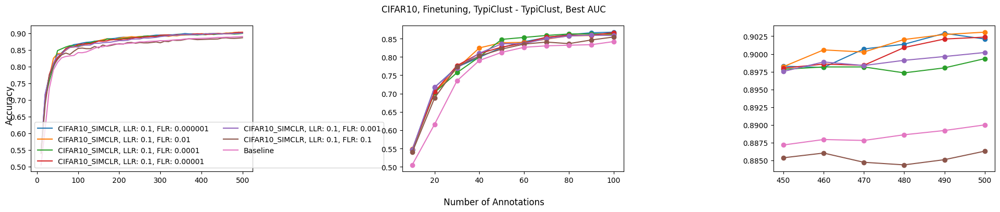

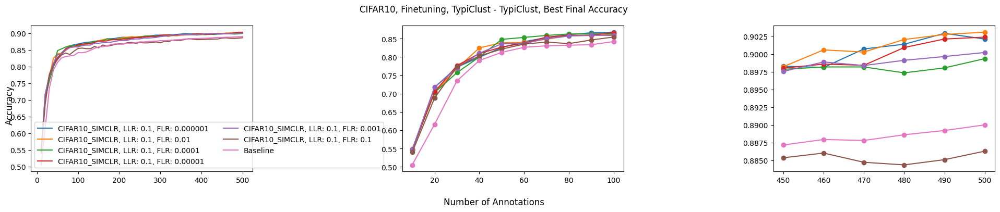

In [57]:
best_auc_learning_curves = sorted(typiclust_lrs.items(), key=lambda x: x[1]["auc"], reverse=True)[:6]
best_auc_learning_curves.append(('Baseline', typiclust_lrs["Baseline"]))

exps = {}
for exp in best_auc_learning_curves:
    exps[exp[0]] = exp[1]

plot_learning_curves(exps, title = f"CIFAR10, Finetuning, TypiClust - TypiClust, Best AUC", save=False, savePath="", plot_std=False, xlim=[None, (10, 100), (450, 500)])

best_facc_learning_curves = sorted(typiclust_lrs.items(), key=lambda x: x[1]["auc"], reverse=True)[:6]
best_facc_learning_curves.append(('Baseline', typiclust_lrs["Baseline"]))

exps = {}
for exp in best_facc_learning_curves:
    exps[exp[0]] = exp[1]

plot_learning_curves(exps, title = f"CIFAR10, Finetuning, TypiClust - TypiClust, Best Final Accuracy", save=False, savePath="", plot_std=False, xlim=[None, (10, 100), (450, 500)])

### SVHN Fully supervised

In [ ]:
n_init=10
acq_size=10
n_acq=49


for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random (Spectral)": create_new_results_path(Dataset.SVHN_spectral_supervised.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust (Spectral)": create_new_results_path(Dataset.SVHN_spectral_supervised.value, model, Strategy.RandomClust.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "Entropy (Spectral)": create_new_results_path(Dataset.SVHN_spectral_supervised.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "TypiClust (Spectral)": create_new_results_path(Dataset.SVHN_spectral_supervised.value, model, Strategy.TypiClust.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "CoreSet (Spectral)": create_new_results_path(Dataset.SVHN_spectral_supervised.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "Random": create_new_results_path(Dataset.SVHN_supervised.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.SVHN_supervised.value, model, Strategy.RandomClust.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "Entropy": create_new_results_path(Dataset.SVHN_supervised.value, model, Strategy.Entropy.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "TypiClust": create_new_results_path(Dataset.SVHN_supervised.value, model, Strategy.TypiClust.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "CoreSet": create_new_results_path(Dataset.SVHN_supervised.value, model, Strategy.CoreSet.value, Strategy.Random.value, n_init, acq_size, n_acq),
        # "XPAL": create_results_path(dataset, model, Strategy.XPAL.value, budget),
        # "XPALClust": create_results_path(dataset, model, Strategy.XPALClust.value, budget),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    try:
        exps = generate_learning_curves(experiments)
        plot_learning_curves(exps, title = f"Representation Difference, {model_name}, Test Accuracy", save=False, savePath="", plot_std=False)
        plot_learning_curves(exps, title = f"Representation Difference, {model_name}, Test Accuracy", save=False, savePath="", plot_std=False, xlim=(0, 65))
    except FileNotFoundError as e:
        print(e)

for model  in [Model.PWC, Model.Linear]:
    model_name = model.name
    model = model.value

    experiments = {
        "Random (Spectral)": create_new_results_path(Dataset.SVHN_spectral_supervised.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust (Spectral)": create_new_results_path(Dataset.SVHN_spectral_supervised.value, model, Strategy.RandomClust.value, Strategy.RandomClust.value, n_init, acq_size, n_acq),
        "TypiClust (Spectral)": create_new_results_path(Dataset.SVHN_spectral_supervised.value, model, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq),
        "Random": create_new_results_path(Dataset.SVHN_supervised.value, model, Strategy.Random.value, Strategy.Random.value, n_init, acq_size, n_acq),
        "RandomClust": create_new_results_path(Dataset.SVHN_supervised.value, model, Strategy.RandomClust.value, Strategy.RandomClust.value, n_init, acq_size, n_acq),
        "TypiClust": create_new_results_path(Dataset.SVHN_supervised.value, model, Strategy.TypiClust.value, Strategy.TypiClust.value, n_init, acq_size, n_acq),
        # "XPAL": create_results_path(dataset, model, Strategy.XPAL.value, budget),
        # "XPALClust": create_results_path(dataset, model, Strategy.XPALClust.value, budget),
    }

    # savePath = Path(os.path.join("learning_curves", Dataset.SVHN.value, model, f"budet{budget}.png"))
    # os.makedirs(os.path.join("learning_curves", Dataset.SVHN.value, model), exist_ok=True)

    try:
        exps = generate_learning_curves(experiments)
        plot_learning_curves(exps, title = f"Representation Difference, {model_name}, Test Accuracy, Self-Initilization", save=False, savePath="", plot_std=False)
        plot_learning_curves(exps, title = f"Representation Difference, {model_name}, Test Accuracy, Self-Initilization", save=False, savePath="", plot_std=False, xlim=(0, 65))
    except FileNotFoundError as e:
        print(e)

## XPAL Comparison

### Comparison

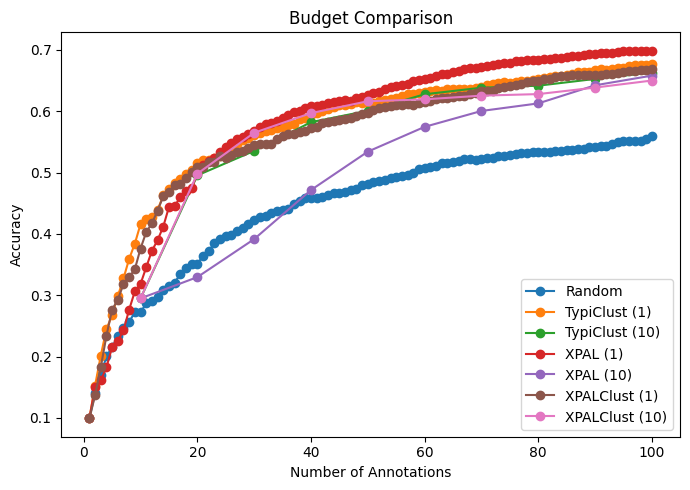

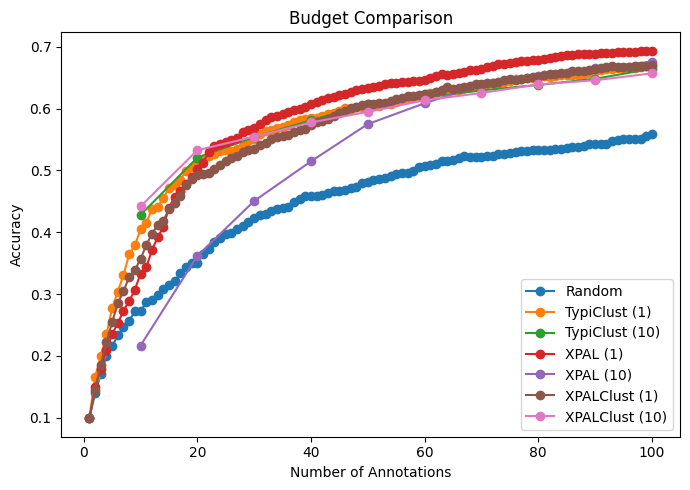

In [6]:
# Generating XPAL Comparison

experiments = {
    "Random": create_results_path("CIFAR10" ,"pwc", Strategy.Random.value, "100_acq_1"),
    "TypiClust (1)": create_results_path("CIFAR10", "pwc", Strategy.TypiClust.value, "100_acq_1"),
    "TypiClust (10)": create_results_path("CIFAR10", "pwc", Strategy.TypiClust.value, "100"),
    "XPAL (1)": create_results_path("CIFAR10", "pwc", Strategy.XPAL.value, "100_acq_1"),
    "XPAL (10)": create_results_path("CIFAR10", "pwc", Strategy.XPAL.value, "100"),
    "XPALClust (1)": create_results_path("CIFAR10", "pwc", Strategy.XPALClust.value, "100_acq_1"),
    "XPALClust (10)": create_results_path("CIFAR10", "pwc", Strategy.XPALClust.value, "100"),
}

plot_learning_curves(generate_learning_curves(experiments), title = f"Budget Comparison", save=False, plot_std=False)

experiments = {
    "Random": create_results_path("CIFAR10" ,"pwc", Strategy.Random.value, "100_acq_1_self_initialization"),
    "TypiClust (1)": create_results_path("CIFAR10", "pwc", Strategy.TypiClust.value, "100_acq_1_self_initialization"),
    "TypiClust (10)": create_results_path("CIFAR10", "pwc", Strategy.TypiClust.value, "100_self_initialization"),
    "XPAL (1)": create_results_path("CIFAR10", "pwc", Strategy.XPAL.value, "100_acq_1_self_initialization"),
    "XPAL (10)": create_results_path("CIFAR10", "pwc", Strategy.XPAL.value, "100_self_initialization"),
    "XPALClust (1)": create_results_path("CIFAR10", "pwc", Strategy.XPALClust.value, "100_acq_1_self_initialization"),
    "XPALClust (10)": create_results_path("CIFAR10", "pwc", Strategy.XPALClust.value, "100_self_initialization"),
}

plot_learning_curves(generate_learning_curves(experiments), title = f"Budget Comparison", save=False, plot_std=False)

### Budget 100

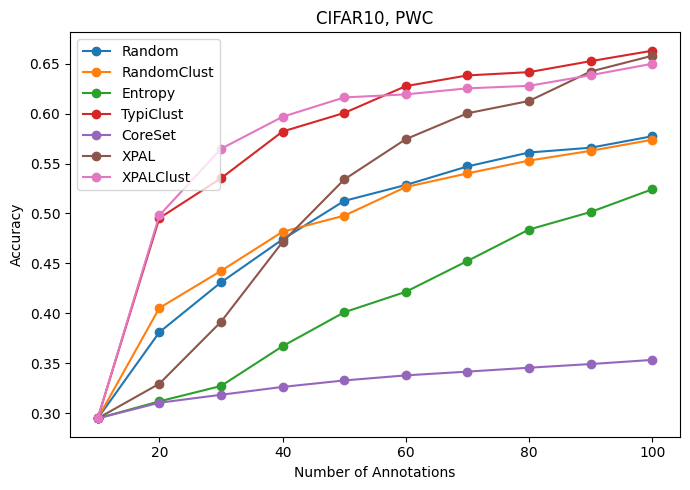

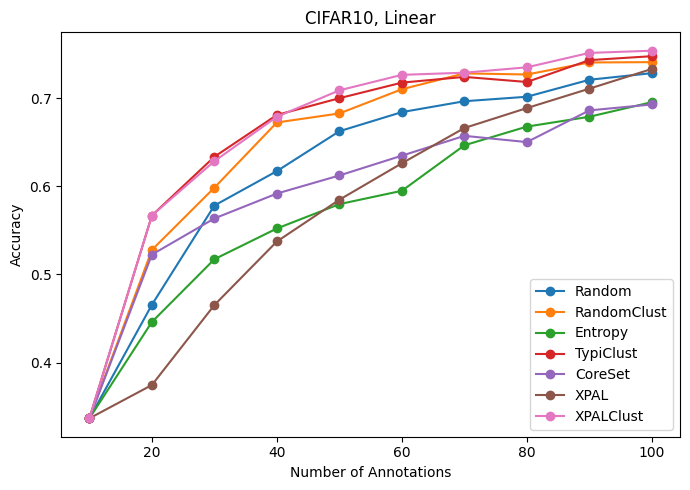

In [7]:
budget = "100"

for dataset, model  in lp:
    dataset_name = dataset.name
    model_name = model.name

    dataset = dataset.value
    model = model.value

    experiments = {
        "Random": create_results_path(dataset, model, Strategy.Random.value, budget),
        "RandomClust": create_results_path(dataset, model, Strategy.RandomClust.value, budget),
        "Entropy": create_results_path(dataset, model, Strategy.Entropy.value, budget),
        "TypiClust": create_results_path(dataset, model, Strategy.TypiClust.value, budget),
        "CoreSet": create_results_path(dataset, model, Strategy.CoreSet.value, budget),
        "XPAL": create_results_path(dataset, model, Strategy.XPAL.value, budget),
        "XPALClust": create_results_path(dataset, model, Strategy.XPALClust.value, budget),
        # "XPAL (Full)": create_results_path(dataset, model, Strategy.XPAL_NONE.value, budget)
    }

    if model == Model.PWC_Standardized.value:
        continue
        del experiments["XPALClust"]
        del experiments["RandomClust"]

    savePath = Path(os.path.join("learning_curves", dataset, model, f"budet{budget}.png"))
    os.makedirs(os.path.join("learning_curves", dataset, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"{dataset_name}, {model_name}", save=True, savePath=savePath, plot_std=False)
    except FileNotFoundError as e:
        print(e)

### Budget 100 Self Initialization

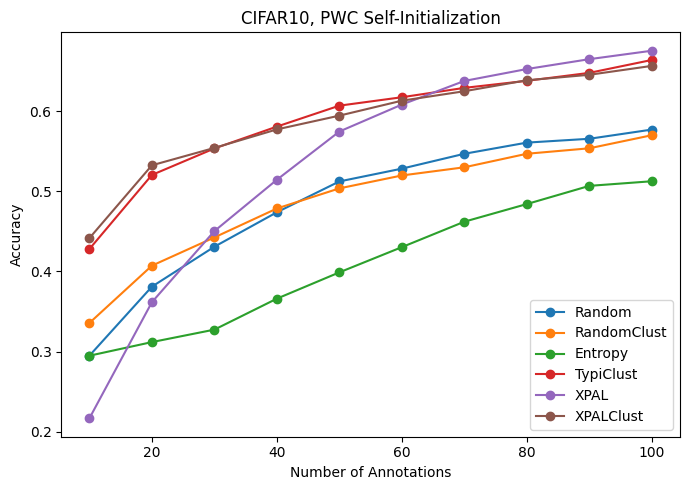

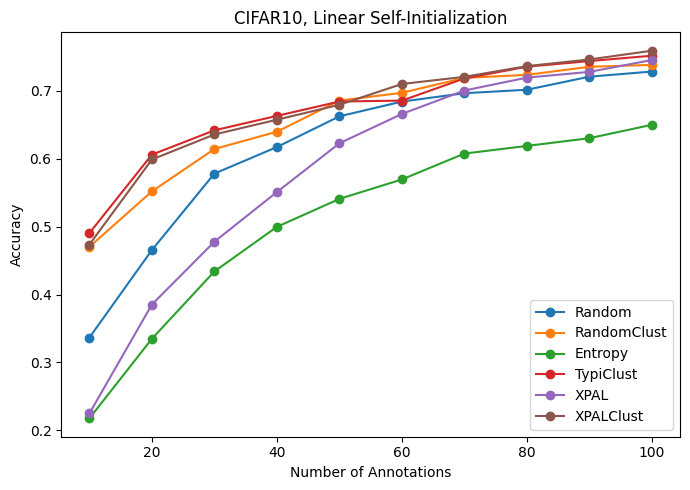

In [8]:
budget = "100_self_initialization"

for dataset, model  in lp:
    dataset_name = dataset.name
    model_name = model.name

    dataset = dataset.value
    model = model.value

    if model == Model.PWC_Standardized.value:
        continue

    experiments = {
        "Random": create_results_path(dataset, model, Strategy.Random.value, budget),
        "RandomClust": create_results_path(dataset, model, Strategy.RandomClust.value, budget),
        "Entropy": create_results_path(dataset, model, Strategy.Entropy.value, budget),
        "TypiClust": create_results_path(dataset, model, Strategy.TypiClust.value, budget),
        "XPAL": create_results_path(dataset, model, Strategy.XPAL.value, budget),
        "XPALClust": create_results_path(dataset, model, Strategy.XPALClust.value, budget),
    }

    savePath = Path(os.path.join("learning_curves", dataset, model, f"budet{budget}.png"))
    os.makedirs(os.path.join("learning_curves", dataset, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"{dataset_name}, {model_name} Self-Initialization", save=True, savePath=savePath, plot_std=False)
    except FileNotFoundError as e:
        print(e)

### Budget 100 Acq 1

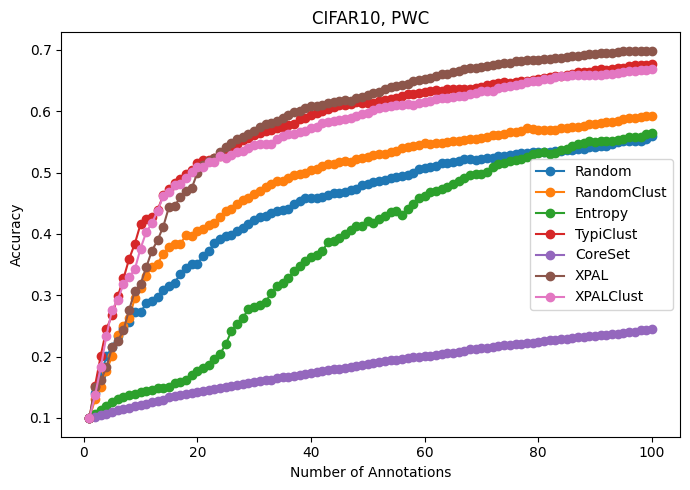

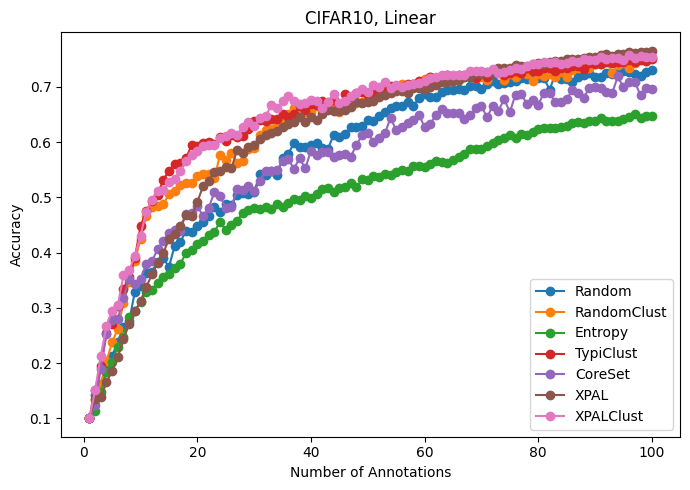

In [9]:
budget = "100_acq_1"

for dataset, model  in lp:
    dataset_name = dataset.name
    model_name = model.name

    dataset = dataset.value
    model = model.value

    if model == Model.PWC_Standardized.value:
        continue


    experiments = {
        "Random": create_results_path(dataset, model, Strategy.Random.value, budget),
        "RandomClust": create_results_path(dataset, model, Strategy.RandomClust.value, budget),
        "Entropy": create_results_path(dataset, model, Strategy.Entropy.value, budget),
        "TypiClust": create_results_path(dataset, model, Strategy.TypiClust.value, budget),
        "CoreSet": create_results_path(dataset, model, Strategy.CoreSet.value, budget),
        "XPAL": create_results_path(dataset, model, Strategy.XPAL.value, budget),
        "XPALClust": create_results_path(dataset, model, Strategy.XPALClust.value, budget),
    }

    if model == Model.PWC_Standardized.value:
        del experiments["XPALClust"]

    savePath = Path(os.path.join("learning_curves", dataset, model, f"budet{budget}.png"))
    os.makedirs(os.path.join("learning_curves", dataset, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"{dataset_name}, {model_name}", save=True, savePath=savePath, plot_std=False)
    except FileNotFoundError as e:
        print(e)

### Budget 100 Acq 1 Self Initialization

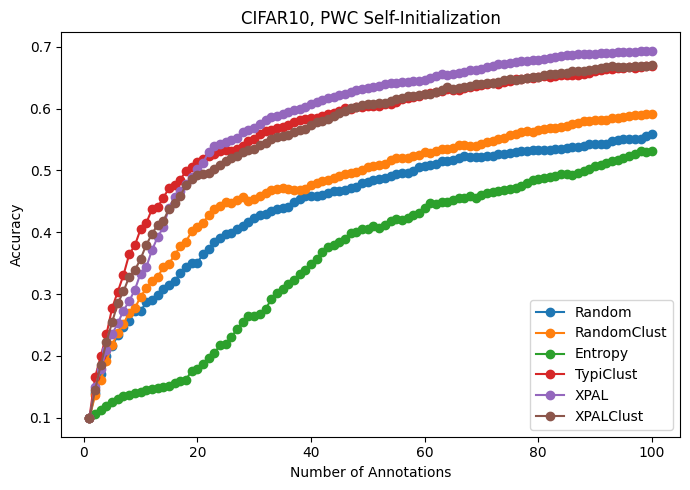

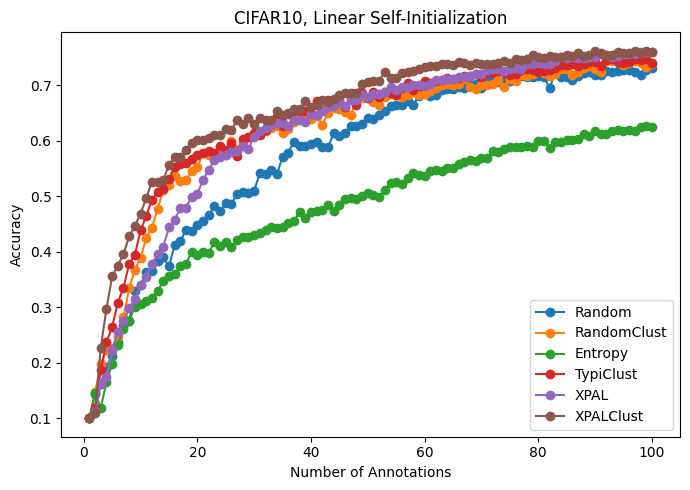

In [10]:
budget = "100_acq_1_self_initialization"

for dataset, model  in lp:
    dataset_name = dataset.name
    model_name = model.name

    dataset = dataset.value
    model = model.value

    if model == Model.PWC_Standardized.value:
        continue

    experiments = {
        "Random": create_results_path(dataset, model, Strategy.Random.value, budget),
        "RandomClust": create_results_path(dataset, model, Strategy.RandomClust.value, budget),
        "Entropy": create_results_path(dataset, model, Strategy.Entropy.value, budget),
        "TypiClust": create_results_path(dataset, model, Strategy.TypiClust.value, budget),
        "XPAL": create_results_path(dataset, model, Strategy.XPAL.value, budget),
        "XPALClust": create_results_path(dataset, model, Strategy.XPALClust.value, budget),
    }

    savePath = Path(os.path.join("learning_curves", dataset, model, f"budet{budget}.png"))
    os.makedirs(os.path.join("learning_curves", dataset, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"{dataset_name}, {model_name} Self-Initialization", save=True, savePath=savePath, plot_std=False)
    except FileNotFoundError as e:
        print(e)

### Budget 300 Acq 1 Self Initialization

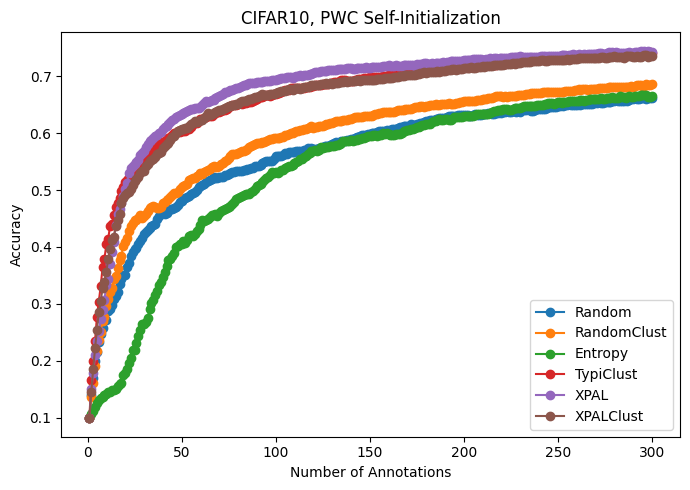

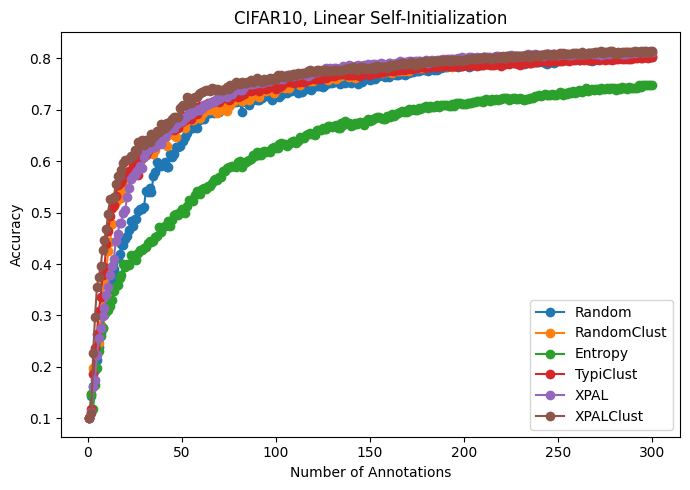

In [11]:
budget = "300_acq_1_self_initialization"

for dataset, model  in lp:
    dataset_name = dataset.name
    model_name = model.name

    dataset = dataset.value
    model = model.value

    if model == Model.PWC_Standardized.value:
        continue

    experiments = {
        "Random": create_results_path(dataset, model, Strategy.Random.value, budget),
        "RandomClust": create_results_path(dataset, model, Strategy.RandomClust.value, budget),
        "Entropy": create_results_path(dataset, model, Strategy.Entropy.value, budget),
        "TypiClust": create_results_path(dataset, model, Strategy.TypiClust.value, budget),
        "XPAL": create_results_path(dataset, model, Strategy.XPAL.value, budget),
        "XPALClust": create_results_path(dataset, model, Strategy.XPALClust.value, budget),
    }

    savePath = Path(os.path.join("learning_curves", dataset, model, f"budet{budget}.png"))
    os.makedirs(os.path.join("learning_curves", dataset, model), exist_ok=True)

    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"{dataset_name}, {model_name} Self-Initialization", save=True, savePath=savePath, plot_std=False)
    except FileNotFoundError as e:
        print(e)

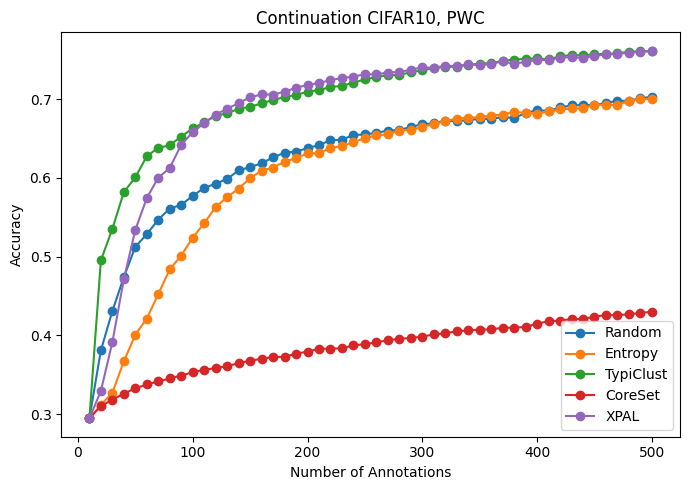

In [12]:
# Budget 500

experiments = {
    "Random": create_results_path(dataset, "pwc", Strategy.Random.value, 500),
    "Entropy": create_results_path(dataset, "pwc", Strategy.Entropy.value, 500),
    "TypiClust": create_results_path(dataset, "pwc", Strategy.TypiClust.value, 500),
    "CoreSet": create_results_path(dataset, "pwc", Strategy.CoreSet.value, 500),
    "XPAL": create_results_path(dataset, "pwc", Strategy.XPAL.value, 500),
}
try:
    plot_learning_curves(generate_learning_curves(experiments), title = f"Continuation CIFAR10, PWC", save=False, plot_std=False)
except FileNotFoundError as e:
    print(e)

## XPAL Hparams

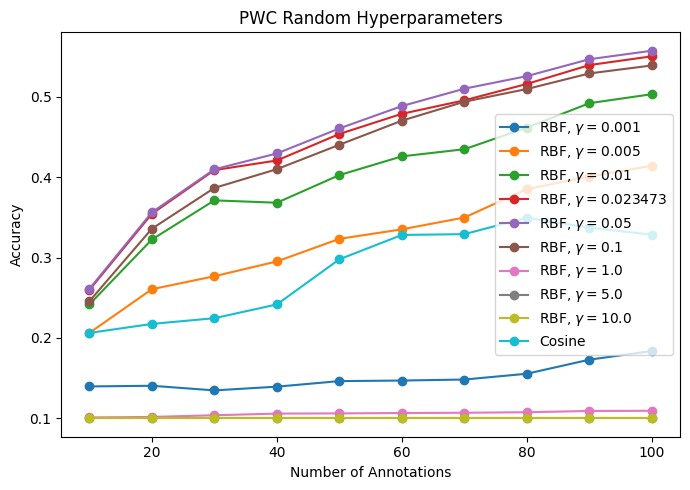

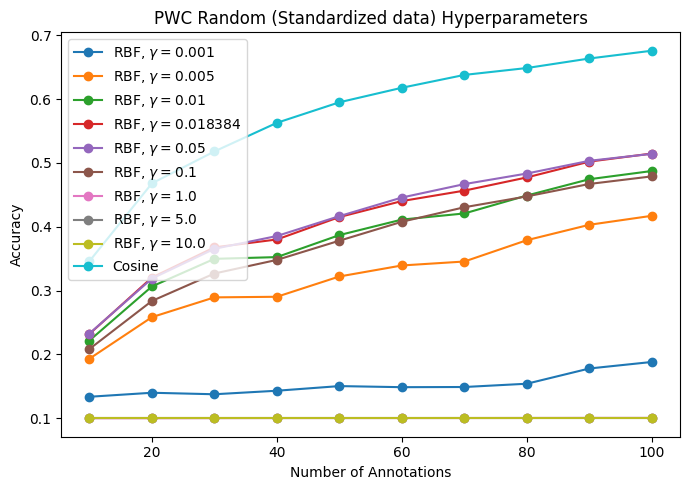

In [11]:
rbf_gammas = (0.001, 0.005, 0.01, 0.023473, 0.05, 0.1, 1.0, 5.0, 10.0)

experiments = {"RBF, $\gamma=$" + str(gamma):xpal_haparams_path("rbf", str(gamma)) for gamma in rbf_gammas}
experiments["Cosine"] = xpal_haparams_path("cosine")

try:
    plot_learning_curves(generate_learning_curves(experiments), title = "PWC Random Hyperparameters", save=True, savePath=savePath, plot_std=False)
except FileNotFoundError as e:
    print(e)

rbf_gammas = (0.001, 0.005, 0.01, 0.018384, 0.05, 0.1, 1.0, 5.0, 10.0)

experiments = {"RBF, $\gamma=$" + str(gamma):xpal_haparams_standardized_path("rbf", str(gamma)) for gamma in rbf_gammas}
experiments["Cosine"] = xpal_haparams_standardized_path("cosine")

try:
    plot_learning_curves(generate_learning_curves(experiments), title = "PWC Random (Standardized data) Hyperparameters", save=False, plot_std=False)
except FileNotFoundError as e:
    print(e)

In [12]:
rbf_gammas = (0.001, 0.005, 0.01, "calculate", 0.05, 0.1, 1.0, 5.0, 10.0)
alphas= ("1e-3", "1e-5", "1e-7", "1e-9", "1e-10", "1e-11", "1e-12", "1e-16")

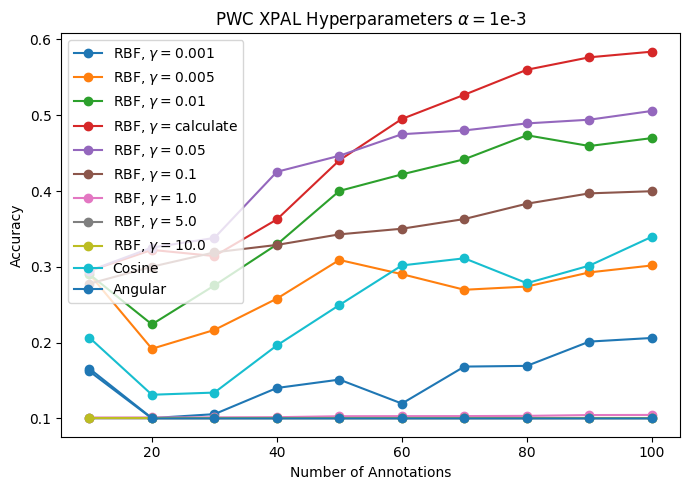

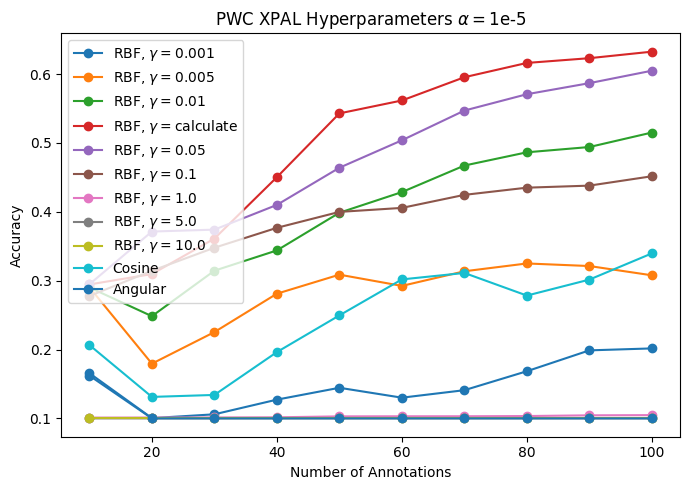

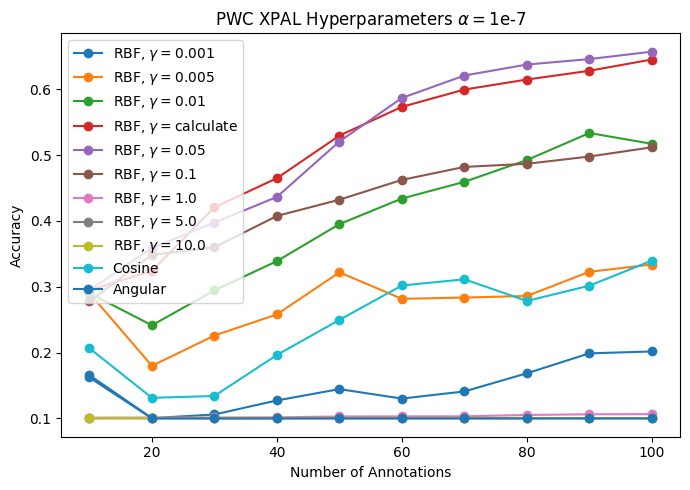

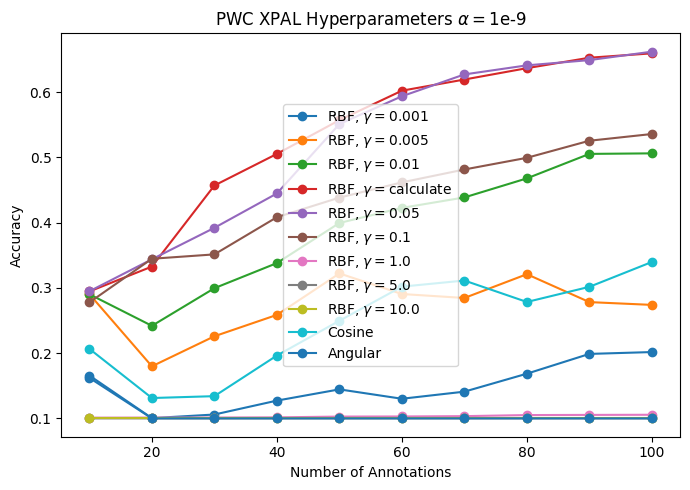

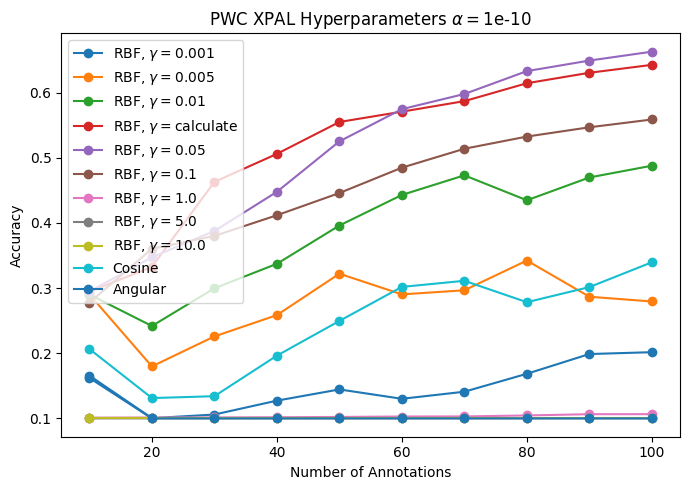

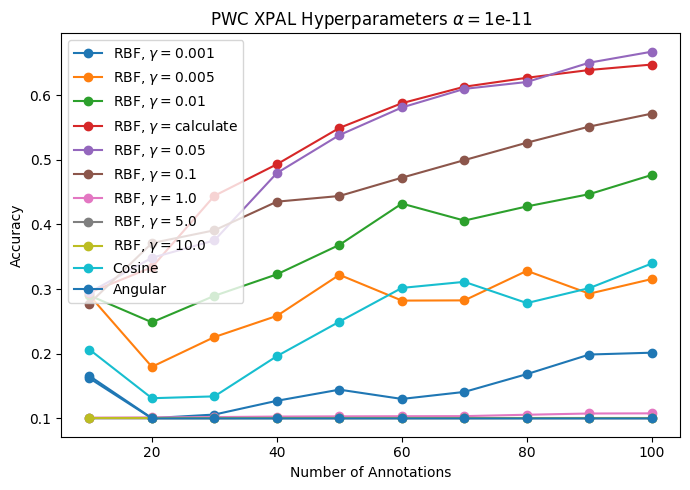

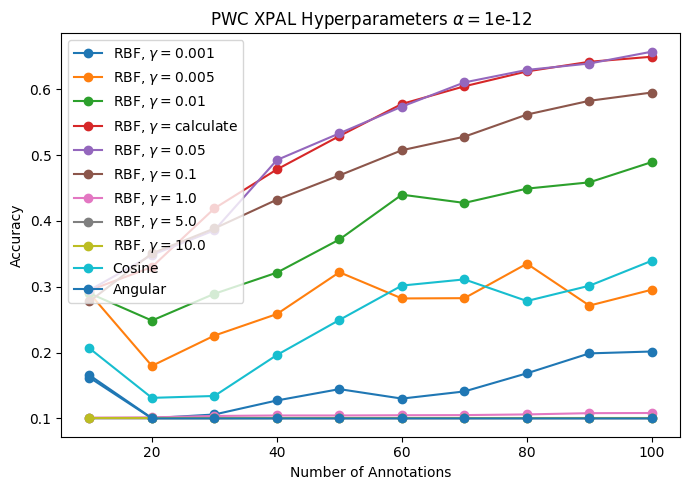

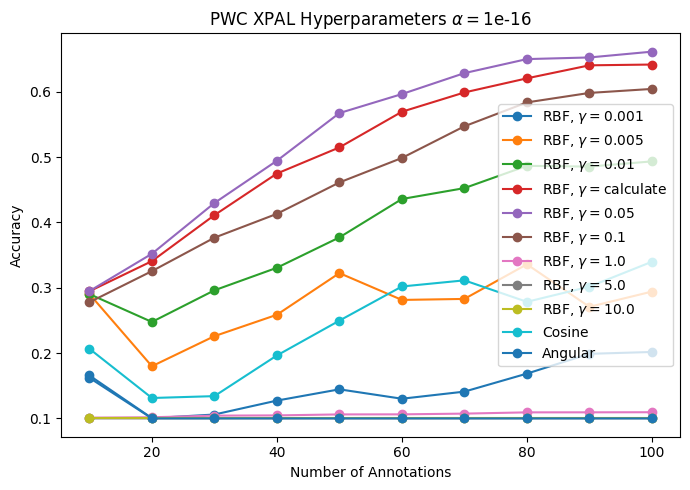

In [13]:
for alpha in alphas:
    experiments = {f"RBF, $\gamma=${str(gamma)}":xpal_haparams_new_path("rbf", str(gamma), alpha) for gamma in rbf_gammas}
    experiments.update({f"Cosine":xpal_haparams_new_path("cosine", alpha=alpha)})
    experiments.update({f"Angular":xpal_haparams_new_path("angular", alpha=alpha)})
    
    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"PWC XPAL Hyperparameters $\\alpha=${alpha}", save=False, plot_std=False)
    except FileNotFoundError as e:
        print(e)

In [14]:
experiments = {f"RBF, $\gamma=${str(gamma)}, $\\alpha=${alpha}":xpal_haparams_new_path("rbf", str(gamma), alpha) for gamma in rbf_gammas for alpha in alphas}
exps = generate_learning_curves(experiments)

_max = None
max_acc = 0
for key, value in exps.items():
    if value["acc"][-1] > max_acc:
        _max = key
        max_acc = value["acc"][-1]

print(f"Max final accuracy: {max_acc} reached with_ {_max}")

Max final accuracy: 0.6673199892044067 reached with_ RBF, $\gamma=$0.05, $\alpha=$1e-11


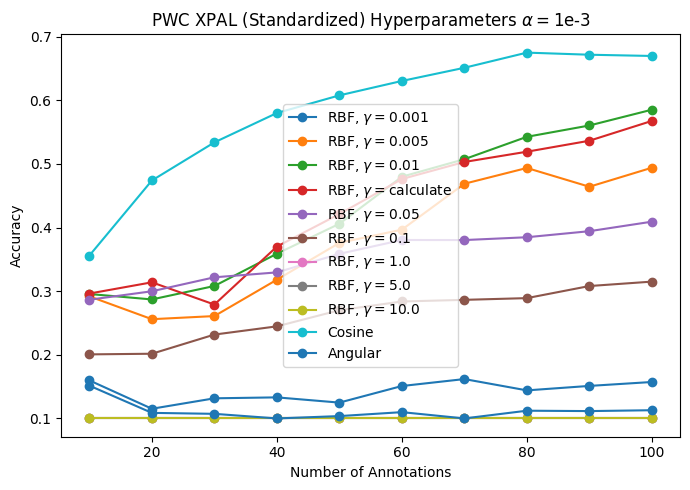


KeyboardInterrupt



In [15]:
for alpha in alphas:
    experiments = {f"RBF, $\gamma=${str(gamma)}":xpal_haparams_new_stand_path("rbf", str(gamma), alpha) for gamma in rbf_gammas}
    experiments.update({f"Cosine":xpal_haparams_new_stand_path("cosine", alpha=alpha)})
    experiments.update({f"Angular":xpal_haparams_new_stand_path("angular", alpha=alpha)})
    
    try:
        plot_learning_curves(generate_learning_curves(experiments), title = f"PWC XPAL (Standardized) Hyperparameters $\\alpha=${alpha}", save=False, plot_std=False)
    except FileNotFoundError as e:
        print(e)

In [ ]:
rbf_gammas = ("calculate", 0.05)
alphas= ("1e-3", "1e-5", "1e-7", "1e-9", "1e-10", "1e-11", "1e-12", "1e-16")

experiments = {f"RBF, $\gamma=${str(gamma)}, $\\alpha=${alpha}":xpal_haparams_new_stand_path("rbf", str(gamma), alpha) for gamma in rbf_gammas for alpha in alphas}
experiments.update({f"Cosine $\\alpha=${alpha}":xpal_haparams_new_stand_path("cosine", alpha=alpha) for alpha in alphas})

exps = generate_learning_curves(experiments)

_max = None
max_acc = 0
for key, value in exps.items():
    if value["acc"][-1] > max_acc:
        _max = key
        max_acc = value["acc"][-1]

print(f"Max final accuracy: {max_acc} reached with_ {_max}")

## XPAL vs. TypiClust

In [ ]:
features_dir = os.path.join(os.sep, "mnt", "stud", "home", "ynagel", "data", "resnet18_cifar10_87_leacc.pth")
data_dir = os.path.join(os.sep, "mnt", "stud", "home", "ynagel", "data")

cifar_classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

def show_image_batch(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
    plt.show()

def get_class_distribution_and_images(dataset, model, strategy, budget, seed, features_dir=features_dir):
    # Get data representation and labels
    seed_everything(seed)
    data = FeatureDatasetWrapper(features_dir)
    labels = np.array([int(label) for _, label in data.train_dataset])

    # Getting indices
    res_path = Path(os.path.join(base_results_path, dataset, model, strategy, f"budget_{budget}", f"seed{seed}", "queried_indices.json"))
    indices = load_json(res_path)
    chosen_labels = [labels[val] for val in indices.values()]

    # Getting images # Not working 
    # cifar = CIFAR10Plain(data_dir, seed=42)
    # images = torch.stack([img for img, _ in cifar.train_dataset])
    # chosen_images = [images[val] for val in indices.values()]
    chosen_images = None
    return chosen_labels, chosen_images

In [ ]:
seeds = [i for i in range(1, 11)]

typiclust = np.zeros(10)
xpal = np.zeros(10)

for seed in seeds:
    typi_dist, _ = get_class_distribution_and_images("CIFAR10", "pwc", "typiclust", "100", seed)
    xpal_dist, _ = get_class_distribution_and_images("CIFAR10", "pwc", "xpal", "100", seed)

    for typi_clycle, xpal_cylce in zip(typi_dist, xpal_dist):
        typi_labels, typi_counts = np.unique(typi_clycle, return_counts=True)
        xpal_labels, xpal_counts = np.unique(xpal_cylce, return_counts=True)
    
        typiclust[typi_labels] += typi_counts
        xpal[xpal_labels] += xpal_counts
        
fig, axes = plt.subplots(nrows=2)
labels = np.arange(10)

axes[0].bar(labels, typiclust, align='center')
axes[0].set_xticks([i for i in range(10)], cifar_classes)
axes[0].set_title("TypiClust")
axes[1].bar(labels, xpal, align='center')
axes[1].set_xticks([i for i in range(10)], cifar_classes)
axes[1].set_title("XPAL")
fig.suptitle("10 Sample per Cycle")
fig.tight_layout()
plt.show()

In [ ]:
seeds = [i for i in range(1, 11)]

typiclust = np.zeros(10)
xpal = np.zeros(10)

for seed in seeds:
    typi_dist, _ = get_class_distribution_and_images("CIFAR10", "pwc", "typiclust", "100_acq_1", seed)
    xpal_dist, _ = get_class_distribution_and_images("CIFAR10", "pwc", "xpal", "100_acq_1", seed)

    for typi_clycle, xpal_cylce in zip(typi_dist, xpal_dist):
        typi_labels, typi_counts = np.unique(typi_clycle, return_counts=True)
        xpal_labels, xpal_counts = np.unique(xpal_cylce, return_counts=True)
    
        typiclust[typi_labels] += typi_counts
        xpal[xpal_labels] += xpal_counts
        
fig, axes = plt.subplots(nrows=2)
labels = np.arange(10)

axes[0].bar(labels, typiclust, align='center')
axes[0].set_xticks([i for i in range(10)], cifar_classes)
axes[0].set_title("TypiClust")
axes[1].bar(labels, xpal, align='center')
axes[1].set_xticks([i for i in range(10)], cifar_classes)
axes[1].set_title("XPAL")
fig.suptitle("1 Sample per Cycle")
fig.tight_layout()
plt.show()

In [ ]:
seeds = [i for i in range(1, 11)]

typiclust = [np.zeros(10) for i in range(10)]
xpal = [np.zeros(10) for i in range(10)]

for seed in seeds:
    typi_dist, _ = get_class_distribution_and_images("CIFAR10", "pwc", "typiclust", "100", seed)
    xpal_dist, _ = get_class_distribution_and_images("CIFAR10", "pwc", "xpal", "100", seed)

    for idx, (typi_clycle, xpal_cylce) in enumerate(zip(typi_dist, xpal_dist)):
        typi_labels, typi_counts = np.unique(typi_clycle, return_counts=True)
        xpal_labels, xpal_counts = np.unique(xpal_cylce, return_counts=True)
    
        typiclust[idx][typi_labels] += typi_counts
        xpal[idx][xpal_labels] += xpal_counts

fig, axes = plt.subplots(nrows=10, ncols=2, figsize=(12, 24))
labels = np.arange(10)
for i in range(10):
    axes[i][0].bar(labels, typiclust[i], align='center')
    axes[i][0].set_xticks([i for i in range(10)], cifar_classes)
    axes[i][0].set_title(f"TypiClust Cycle {i}")
    axes[i][1].bar(labels, xpal[i], align='center')
    axes[i][1].set_xticks([i for i in range(10)], cifar_classes)
    axes[i][1].set_title(f"XPAL Cycle {i}")
fig.tight_layout()
plt.show()